# Detection of parked cars in the city of Granada.
## Image segmentation using deep learning techniques.
### Notebook 6: Segmentation Model using DeepLabV3+ in Granada Dataset

### Authors:
- **Luis Crespo Orti**
- **Isabel María Moreno Cuadrado**
- **Pablo Olivares Martínez**
- **Ximo Sanz Tornero**

# 1. Approach A

## 1.1. Previous steps

### 1.1.1. Instalation and package importation

In [1]:
%pip install torch torchvision fastai segmentation-models-pytorch opencv-python

In [2]:
from fastai.vision.all import *
from pathlib import Path
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt
import cv2
import csv

### 1.1.2. Evaluation of the graphics card

Here we display the graphic card we are using and subsequently confirm the availability of the GPU. This step is taken to ensure that we do not default to using the CPU, as doing so would result in significantly higher time costs. We have previously installed the Torch library for NVIDIA GPUs on Linux, which includes CUDA acceleration, for the local executions we have conducted. Ultimately, however, the entire collaboration has been executed in google collab.

In [3]:
!nvidia-smi

Sun Jan 14 19:50:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
print(torch.cuda.device(0))
print(torch.cuda.get_device_name(0))
print(torch.cuda.is_available())

Tesla T4
True


### 1.1.3. Importation from Google Drive

In [5]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


## 1.2. Data loading

### 1.2.1 Declaration of auxiliary functions

In [6]:
def get_y_fn(x):
    """
    Given the image route, it returns it's corresponding mask.
    """
    return Path(str(x).replace('src', 'gt').replace('.jpg', '.png'))


def get_items(path):
    """
    Obtains a list of every image in the 'src' folder
    """
    return get_image_files(path/'src')

### Comprehensive Guide to Mask Normalization and Denormalization Functions

#### Function to Normalize Masks

The `normalize_mask` function is a crucial component in image processing, particularly in the context of semantic segmentation in computer vision. It transforms an RGB mask image into a class mask, where each pixel's class is represented by a unique value.

##### Key Functionalities:
- **Input Validation**: It checks if the input mask is an RGB image with three color channels. If not, it raises a ValueError, ensuring that only correctly formatted masks are processed.
- **Class Mask Creation**: The function creates a zero-initialized array (`mask_class`) of the same height and width as the input mask, but with a single channel, to store class values.
- **Color-to-Class Mapping**: For each unique color defined in the `mapping` dictionary (where colors are keys and class values are values), the function locates pixels in the original mask that match the color and assigns the corresponding class value to those pixels in `mask_class`.

#### Function to Denormalize Masks

The `denormalize_mask` function performs the reverse operation of `normalize_mask`. It converts a class mask back into an RGB mask, which is useful for visualizing the segmentation results.

##### Key Functionalities:
- **Inverse Mapping**: It first creates an inverse mapping from class values to colors.
- **Color Mask Creation**: Similar to `normalize_mask`, it initializes a zero-valued RGB mask (`mask_color`).
- **Class-to-Color Conversion**: The function iterates over each unique class value in `mask_class`, retrieves the corresponding color from the inverse mapping, and applies this color to all pixels of that class in the new RGB mask.

#### Mapping Colors for Class Normalization

The `mapping_class_color` dictionary is critical for both normalization and denormalization processes. It defines the correspondence between specific RGB colors and class values, which are used to identify different segments in the image, such as roads, cars, and background.

#### Function to Obtain the Normalized Mask

The `get_mask` function integrates the normalization process into a workflow. It retrieves the mask path for a given item, loads the RGB mask as a


In [7]:
# Definition of the function to normalize masks
def normalize_mask(mask, mapping):
    if mask.ndim != 3 or mask.shape[-1] != 3:
        raise ValueError(
            "La máscara debe ser una imagen RGB con 3 canales de color.")
    h, w, _ = mask.shape
    mask_class = np.zeros((h, w), dtype=np.uint8)
    for color, c in mapping.items():
        mask_class[(mask == color).all(axis=-1)] = c
    return mask_class

# Definition of the function to denormalize masks
def denormalize_mask(mask_class, mapeo):
    inverse_map = {v: k for k, v in mapeo.items()}
    h, w = mask_class.shape
    mask_color = np.zeros((h, w, 3), dtype=np.uint8)
    for c in np.unique(mask_class):
        color = inverse_map[c]
        mask_color[mask_class == c] = color
    return mask_color


# Mapping colors for the class normalization
mapping_class_color_1 = {
    (0, 0, 0): 0,     # Class 0
    (128, 64, 128): 1,  # Class 1 - Road
    (255, 255, 0): 2, # Class 2 - Parked car
    (0, 0, 142): 2  # Class 2 - Car in road
}

# Mapping colors for the class normalization
mapping_class_color_back_1 = {
    (0, 0, 0): 0,     # Clase 0
    (128, 64, 128): 1,  # Class 1 - Road
    (0, 0, 142): 2  # Class 2 - Car in road
}

# Function to obtain the normalized mask as floats
def get_mask(item):
    msk_path = get_y_fn(item)
    msk = np.array(PILImage.create(msk_path))

    # Normalize the mask
    normalized_mask = normalize_mask(msk, mapping_class_color_1)

    return PILMask.create(normalized_mask.astype(np.int32))


## Rationale Behind Custom Splitting Function for Small Dataset

For our project, involving image segmentation in Granada, we have opted against using a random splitting method for dividing our dataset into training and validation sets. Instead, we have implemented a custom splitting function, `splitter_func`. This decision is particularly crucial due to the small size of our dataset. The key reasons for this approach are:

1. **Ensuring Representation**: With a small dataset, random splitting might not guarantee that both training and validation sets represent the full variety of features present in the data. Our custom function ensures that both sets are representative of the overall dataset, including variations in architectural styles, lighting conditions, and urban landscapes specific to Granada.

2. **Controlled Validation Set**: By specifically selecting images for the validation set (`nombres_validacion`), we can ensure that it contains a diverse range of scenarios and challenges that the model needs to handle. This approach allows for a more thorough and meaningful evaluation of the model's performance.

3. **Avoiding Data Leakage**: In small datasets, there's a higher risk of similar or duplicate images being split across training and validation sets, leading to data leakage. Our custom splitter function helps to prevent this by carefully segregating images based on their content.

4. **Consistency Across Experiments**: A predetermined set of validation images ensures consistency in model evaluation across different training sessions. This consistency is vital for accurately assessing model improvements or changes over time.

5. **Aligning with Specific Project Goals**: Our project might have specific goals or requirements (e.g., focusing on certain types of urban scenes or architectural elements). The custom splitter allows us to align the dataset division with these specific objectives.

Further details and the rationale behind this approach, especially in the context of our project's unique requirements and challenges, can be found in the accompanying paper. The paper provides an in-depth discussion of the methodology and its alignment with the goals of accurate and efficient image segmentation in Granada.

In [8]:
# Function for the splitter
def splitter_func(items):
    # List of image names for validation
    nombres_validacion = ['granada9.jpg', 'granada13.jpg', 'granada34.jpg', 'granada42.jpg', 'granada45.jpg', 'granada56.jpg', 'granada69.jpg', 'granada76.jpg', 'granada78.jpg', 'granada89.jpg']

    valid_idx = [i for i, item in enumerate(items) if Path(item).name in nombres_validacion]
    train_idx = [i for i, item in enumerate(items) if Path(item).name not in nombres_validacion]
    return train_idx, valid_idx

In [9]:
def add_shadow(image, num_shadows, min_opacity, max_opacity):
    height, width = image.shape[:2]
    shadow_image = image.copy()

    for _ in range(num_shadows):
        # Randomly generate the shadow polygon
        x1, y1 = random.randint(0, width), random.randint(0, height)
        x2, y2 = random.randint(0, width), random.randint(0, height)
        x3, y3 = random.randint(0, width), random.randint(0, height)
        x4, y4 = random.randint(0, width), random.randint(0, height)

        # Create a black polygon to simulate the shadow
        poly = np.array([[x1, y1], [x2, y2], [x3, y3], [x4, y4]], np.int32)
        cv2.fillPoly(shadow_image, [poly], (0, 0, 0))

        # Blending the shadow with the image
        alpha = random.uniform(min_opacity, max_opacity)
        mask = shadow_image.astype(bool)
        shadow_image = cv2.addWeighted(shadow_image, alpha, image, 1 - alpha, 0, image)
        image[mask] = shadow_image[mask]

    return image

class ShadowTransform(Transform):
    """
    Custom Transform for adding shadows.
    """
    def __init__(self, num_shadows=3, min_opacity=0.5, max_opacity=0.75):
        self.num_shadows = num_shadows
        self.min_opacity = min_opacity
        self.max_opacity = max_opacity

    def encodes(self, x: PILImage):
        return add_shadow(x, self.num_shadows, self.min_opacity, self.max_opacity)

### Data Augmentation and Transformation Strategy for Model Training

In our project, we've employed a comprehensive set of data transformations within our DataBlock, drawing inspiration from the successful practices of renowned architectures like AlexNet. Our goal is to enhance our model's performance by introducing a diverse range of augmented data, simulating various real-world conditions.

#### Default Augmentations: `aug_transforms`
We use `aug_transforms` to apply a suite of standard augmentation techniques:
- **Scaling**: Magnification is controlled with `mult=2`, `min_zoom=0.8`, and `max_zoom=3.0`.
- **Flipping**: Both horizontal (`do_flip=True`) and vertical flips (`flip_vert=True`) are enabled.
- **Rotation**: Images can be rotated up to `max_rotate=90` degrees.
- **Lighting Adjustments**: `max_lighting=0.2` to simulate different lighting conditions.
- **Perspective Warping**: `max_warp=0.2` introduces realistic distortions.
- **Probability Controls**: `p_affine=0.75` and `p_lighting=0.75` control the frequency of affine and lighting transformations, respectively.
- **Additional Parameters**: `mode='bilinear'`, `pad_mode='reflection'`, and `align_corners=True` ensure high-quality transformations.

#### Custom Shadow Transformation
We integrate our custom `ShadowTransform`:
- Adds realistic shadows (`num_shadows=3`) with varying opacities (`min_opacity=0.5`, `max_opacity=0.75`).
- Enhances the model's ability to handle images with varying light conditions and shadow intensities.

#### DataBlock Configuration
- **Number of Classes**: `num_classes = 3`, defining the granularity of our segmentation task.
- **DataBlock Format**: Composed of `ImageBlock` and `MaskBlock` with `num_classes`.
- **Data Retrieval**: `get_items` and `get_mask` functions for fetching images and corresponding masks.
- **Data Splitting**: `RandomSplitter` with a 10% validation set (`valid_pct=0.1`) and a fixed seed for reproducibility.
- **Item and Batch Transformations**: `Resize(256,384)` at item level and a combination of default and custom augmentations at the batch level.
- **Normalization**: `Normalize.from_stats(*imagenet_stats)` standardizes the images based on ImageNet statistics.

#### DataLoader and Visualization
- **DataLoader Creation**: `dataloaders` method generates DataLoaders with a batch size of 32.
- **Visualization**: `show_batch` displays a batch of training data, allowing us to visually inspect the applied transformations.

By integrating a rich set of transformations, both standard and custom, we aim to robustly train our model, ensuring it can generalize well across diverse scenarios. This approach is heavily influenced by the principles seen in models like AlexNet, where diverse data exposure led to significant performance gains. Our tailored transformations specifically address the unique challenges of our dataset, aiming to surpass the effectiveness of standard models.```


In [10]:
# Transformaciones por defecto
aug_transforms = aug_transforms(mult=2, do_flip=True, flip_vert=True,
                                max_rotate=90., min_zoom=0.8, max_zoom=3.0,
                                max_lighting=0.2, max_warp=0.2, p_affine=0.75,
                                p_lighting=0.75, xtra_tfms=None, size=None,
                                mode='bilinear', pad_mode='reflection',
                                align_corners=True, batch=False, min_scale=1)

### 1.2.2 Creation of DataLoader

### Square Resizing Strategy in Data Transformation Pipeline

#### Overview
In our data transformation pipeline, a key step involves resizing all images to a square aspect ratio, specifically to 400x400 pixels. This strategy is carefully chosen based on several critical considerations related to our dataset and technical constraints.

#### Rationale Behind 400x400 Pixel Resizing
1. **Data Extraction Constraints**: Our dataset's original resolution was suboptimal for our needs. To align with the extraction process and maintain consistency, we adopted the 400x400 pixel size. This size is particularly effective for our dataset, which was originally segmented into chunks of this dimension.

2. **Comparison with China Dataset**: The choice of 400x400 pixels also stems from the need to have a similar scale to the China dataset, which is a reference point in our study. Maintaining a consistent scale across datasets is vital for comparative analysis and model training effectiveness.

3. **Optimization for Limited RAM**: The decision to use 400x400 pixel images was influenced by our system's RAM limitations. This size is substantial enough to retain significant image details while ensuring that our hardware resources can efficiently handle the data during processing.

4. **Balancing Resolution and Performance**: Using a smaller size than 400x400 could lead to a loss of essential resolution and image details, adversely affecting the model's performance. Conversely, a larger size could strain our computational resources and potentially introduce inefficiencies in processing.

#### Conclusion
The implementation of square resizing to 400x400 pixels is a strategic decision that balances image resolution, consistency with reference datasets, and our system's technical capabilities. This approach is crucial for ensuring the effectiveness of our image segmentation model and the reliability of our subsequent analyses.

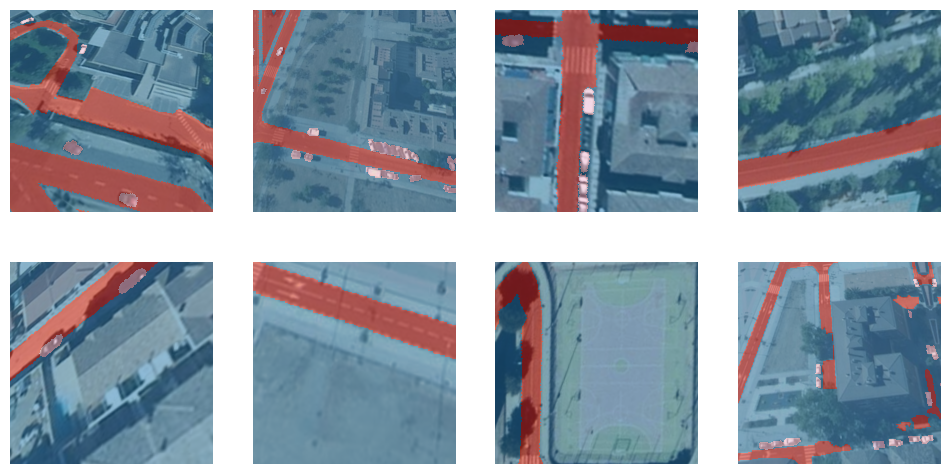

In [11]:
# Definir el número de clases en tu conjunto de datos
num_classes = 3

path_to_dataset = Path('/content/drive/My Drive/GranadaAerial/train')

# Definir el formato de los bloques de datos
data = DataBlock(
    blocks=(ImageBlock, MaskBlock(codes=np.arange(num_classes))),
    get_items=get_items,
    get_y=get_mask,
    splitter=splitter_func,
    item_tfms=RandomResizedCrop(400, min_scale=0.8),
    batch_tfms=[*aug_transforms,Normalize.from_stats(*imagenet_stats)]
)

# Crea DataLoaders y muestra un lote de entrenamiento
dls = data.dataloaders(path_to_dataset, bs=16)
dls.train.show_batch(max_n=8)

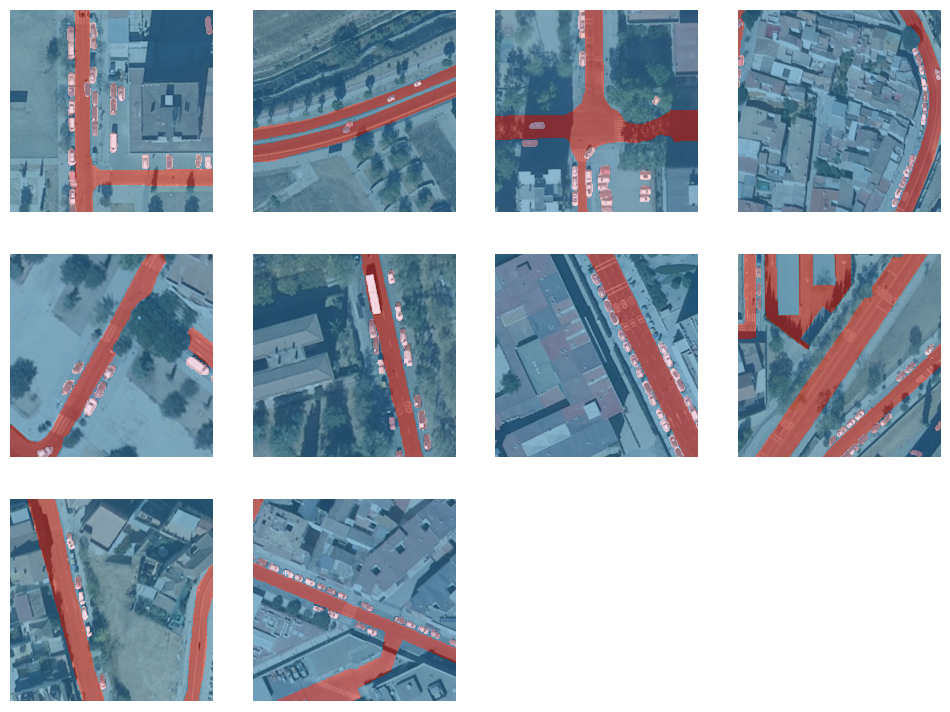

In [12]:
dls.valid.show_batch(max_n=10)

In [13]:
print("Tamaño del conjunto de entrenamiento: ",len(dls.train.items))
print("Tamaño del conjunto de validación: ",len(dls.valid.items))

Tamaño del conjunto de entrenamiento:  70
Tamaño del conjunto de validación:  10


## 1.3. Architecture load using pretrained weights

In [14]:
learner = load_learner('/content/drive/My Drive/deeplab.pkl', cpu=True)
model = learner.model

### Metrics for Performance Assessment
To comprehensively assess the model's performance, we employ a combination of metrics:

- **Foreground Accuracy (foreground_acc)**: This metric, implemented in fastai as `foreground_acc(inp, targ, bkg_idx=0, axis=1)`, computes the non-background accuracy for multiclass segmentation tasks. It focuses on accurately identifying and evaluating the segmentation of the foreground objects, providing insights into the model's ability to delineate objects of interest.

  The mathematical function for `foreground_acc` can be described as follows:

  ```python
  # Pseudo-code representation of the mathematical function
  inp: Predicted segmentation tensor
  targ: Target segmentation tensor
  bkg_idx: Index representing the background class (default is 0)
  axis: Axis along which to calculate accuracy (default is 1)

  # Calculate non-background accuracy
  non_bg_acc = (inp != bkg_idx) & (inp == targ)
  foreground_accuracy = non_bg_acc.sum() / (inp != bkg_idx).sum()


  This metric provides a measure of how accurately the model identifies and segments foreground objects, ignoring the background class.

- **Dice Similarity Coefficient (DiceMulti())**: The Dice coefficient quantifies the overlap between predicted and ground-truth masks using the formula:

  $$
  \text{Dice}(A, B) = \frac{2 \cdot |A \cap B|}{|A| + |B|}
  $$

  Its multi-class variant, `DiceMulti()`, extends this evaluation to multiple classes, enhancing the model's suitability for multi-class segmentation tasks.

- **Jaccard Coefficient (JaccardCoeffMulti())**: Similar to the Dice coefficient, the Jaccard coefficient assesses the overlap between predicted and true masks using the formula:

  $$
  \text{Jaccard}(A, B) = \frac{|A \cap B|}{|A \cup B|}
  $$

  It offers an alternative perspective on segmentation quality, complementing the Dice coefficient in performance assessment.


By combining these metrics, we gain a holistic view of the model's performance, addressing various aspects of segmentation accuracy and overlap. This comprehensive assessment ensures that our model excels in accurately segmenting objects across different classes, which is crucial for our specific application.

<!-- Focal Loss Function: A Powerful Tool for Semantic Segmentation -->

The Focal Loss function, introduced by Lin et al. in their paper titled "Focal Loss for Dense Object Detection," is a critical component in modern semantic segmentation tasks. It addresses some of the challenges posed by class imbalance and helps improve the performance of deep learning models in these tasks.

**Focal Loss Definition:**

The Focal Loss function is defined as:

$$
\mathcal{L}(\hat{y}, y) = - \sum_{i=1}^{N} y_i \log(\hat{y}_i)
$$

where $\hat{y}$ is the predicted probability distribution, $y$ is the true probability distribution and $N$ is the number of classes. This function basically penalizes the model when it predicts a low probability for the true class.

**Advantages of Focal Loss:**

1. **Addressing Class Imbalance:** Focal Loss is particularly effective in scenarios where class imbalance exists. In semantic segmentation, some classes may have significantly fewer pixels or instances compared to others, like our case with cars and roads compared to background. The Focal Loss function dynamically adjusts the loss contribution for each class based on their prediction probabilities. It assigns higher importance to hard-to-predict classes, helping the model focus on improving its performance on these challenging classes.

2. **Reducing the Impact of Easy Samples:** Conventional loss functions like cross-entropy treat all samples equally. In segmentation tasks, there are typically many more background (non-object) pixels than object pixels. Focal Loss reduces the influence of easy-to-classify background pixels, preventing the model from becoming overwhelmed by them and focusing on correctly classifying the foreground objects.

3. **Improved Model Robustness:** By addressing class imbalance and emphasizing hard examples, Focal Loss can lead to more robust models. It can handle situations where some classes may be underrepresented in the training data or where object instances are small and challenging to detect.

4. **Better Convergence:** Focal Loss often leads to faster convergence during training. The reduction in the loss contribution from easily classifiable samples encourages the model to prioritize learning from more informative examples.

5. **Enhanced Performance:** Focal Loss has been widely adopted in various computer vision tasks, including object detection and semantic segmentation, and has demonstrated improved segmentation accuracy and mIoU (mean Intersection over Union) scores.

In summary, the Focal Loss function is a powerful tool for addressing class imbalance and improving the performance of semantic segmentation models. Its ability to dynamically adjust the loss based on the difficulty of samples, reduce the impact of easy samples, and enhance model robustness makes it a compelling choice for many segmentation tasks. Researchers and practitioners often choose Focal Loss to boost the accuracy and reliability of their semantic segmentation models.


In [15]:
learner = Learner(dls, model, loss_func=FocalLoss(), metrics=[foreground_acc, DiceMulti(), JaccardCoeffMulti()])

In [16]:
learner.summary()

/usr/local/lib/python3.10/dist-packages/fastai/metrics.py:373: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/usr/local/lib/python3.10/dist-packages/fastai/metrics.py:390: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


DeepLabV3Plus (Input shape: 16 x 3 x 400 x 400)
Layer (type)         Output Shape         Param #    Trainable 
                     16 x 64 x 200 x 200 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     16 x 64 x 100 x 100 
MaxPool2d                                                      
Conv2d                                    4096       True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
____________________________________________________________________________
                     16 x 256 x 100 x 10 
Conv2d                                    16384      True      
BatchNorm2d                     

## 1.4. Model training

### 1.4.1. Declaration of auxiliary functions

### Function to Display Evaluation Metrics

This function, `plot_metrics`, developed by Ignacio Oguiza and detailed in his [forum post](https://forums.fast.ai/t/plotting-metrics-after-learning/69937), is an extension for the `Recorder` class in FastAI.

The function neatly organizes and displays the training metrics, leveraging the power of matplotlib for visualization. By stacking the values recorded during training and extracting the relevant metric names, it dynamically adjusts the number of rows and columns for the subplot based on the quantity of metrics to be displayed. This dynamic layout ensures that the visual representation is both clear and concise, regardless of the number of metrics.

Special attention is paid to aesthetics and clarity in the graph. Different colors are used to distinguish between training and validation metrics, enhancing the visual appeal and readability. The function also includes a check to hide any extra subplot axes, maintaining a neat presentation.

This utility is particularly useful for model evaluation in machine learning workflows, providing a quick and comprehensive view of performance metrics across both training and validation phases.


In [17]:
# Function to display evaluation metrics
# Developed by Ignacio Oguiza: https://forums.fast.ai/t/plotting-metrics-after-learning/69937
@patch
@delegates(subplots)
def plot_metrics(self: Recorder, nrows=None, ncols=None, figsize=None, **kwargs):
    metrics = np.stack(self.values)
    names = self.metric_names[1:-1]
    n = len(names) - 1
    if nrows is None and ncols is None:
        nrows = int(math.sqrt(n))
        ncols = int(np.ceil(n / nrows))
    elif nrows is None:
        nrows = int(np.ceil(n / ncols))
    elif ncols is None:
        ncols = int(np.ceil(n / nrows))
    figsize = figsize or (ncols * 6, nrows * 4)
    fig, axs = subplots(nrows, ncols, figsize=figsize, **kwargs)
    axs = [ax if i < n else ax.set_axis_off()
           for i, ax in enumerate(axs.flatten())][:n]
    for i, (name, ax) in enumerate(zip(names, [axs[0]] + axs)):
        ax.plot(metrics[:, i], color='#1f77b4' if i ==
                0 else '#ff7f0e', label='valid' if i > 0 else 'train')
        ax.set_title(name if i > 1 else 'losses')
        ax.legend(loc='best')
    plt.show()

### Function to Save Metrics to a CSV File

In our project, we have implemented a function `save_metrics_to_csv` that serves the crucial purpose of exporting training metrics to a CSV file. This functionality enhances data analysis and record-keeping capabilities for machine learning models.

The function takes a `learner` object from the FastAI library and a file path, defaulting to 'unet_metrics.csv', as inputs. By accessing the `recorder` attribute of the learner, it retrieves the stacked array of metric values and their corresponding names.

The core of the function lies in its ability to write these metrics into a CSV file. It begins by creating a file at the specified path and then proceeds to write the headers, which are the names of the metrics, followed by the metric values for each epoch. This process not only captures the numerical essence of the training process but also organizes it in a universally readable format.

This utility proves to be particularly beneficial for long-term tracking and analysis of model performance over multiple training epochs. It facilitates easy sharing and reviewing of results, thus serving as an indispensable tool for collaborative and iterative machine learning development processes. The function culminates by printing a confirmation message, indicating the successful saving of metrics to the specified file path.

In [18]:
# Function to save the metrics to a csv file
def save_metrics_to_csv(learner, file_path='deeplab_metrics.csv', **kwargs):
    recorder = learner.recorder
    metrics = np.stack(recorder.values)
    names = recorder.metric_names[1:-1]

    with open(file_path, mode='w', newline='') as file:
        writer = csv.writer(file)

        # Escribir las cabeceras (nombres de las métricas)
        writer.writerow(['epoch'] + names)

        # Escribir las métricas por época
        for epoch, metric_values in enumerate(metrics):
            writer.writerow([epoch + 1] + list(metric_values))

    print(f"Metrics saved to {file_path}")

### 1.4.2 Weight further fitting

### Domain Adaptation for Image Segmentation

In addressing the challenge of domain adaptation for our image segmentation project, where we maintained three classes consistent with the China dataset, we chose to employ the Fit One Cycle method for model training. This decision was strategically made to enable the model to adapt efficiently to the new domain with minimal epochs.

#### Analysis of Fit One Cycle Results

- **Rapid Adaptation:** The Fit One Cycle method, as evidenced by the results over 12 epochs, has facilitated a rapid adaptation of the model to the new domain. This approach is particularly effective in adjusting the model with a limited number of epochs, ensuring a quick but significant improvement in performance metrics.

- **Performance Metrics Improvement:**
    - *Foreground Accuracy:* There's a noticeable increase in foreground accuracy, starting from 47.617% in the first epoch to 74.210% in the final epoch. This improvement indicates the model's enhanced ability to correctly identify and segment the foreground objects in the new domain.
    - *Dice Multi and Jaccard Coefficient:* Similarly, both the Dice coefficient and Jaccard index show significant improvement. The Dice score, starting at 69.403%, and the Jaccard index, starting at 56.132%, both peak at around the 8th epoch (82.351% for Dice and 71.568% for Jaccard). These metrics reflect the model's growing proficiency in accurately segmenting the images, with a good balance between precision and recall.

- **Training and Validation Loss:** The consistent decrease in both training and validation loss over the epochs is an encouraging sign of the model's increasing accuracy and generalization capability. The relatively parallel decline of these losses suggests that the model is learning effectively without overfitting.

- **Epoch Duration:** The short duration of each epoch, averaging around 8 seconds, demonstrates the efficiency of the Fit One Cycle method. This efficiency is particularly advantageous given the limited computational resources and the need for rapid model iteration.

- **Implications for Domain Shift:** The results suggest that the Fit One Cycle method is an effective strategy for handling domain shift, especially when dealing with a small dataset or when rapid model adaptation is required. It enables the model to quickly learn the new domain's specific features and characteristics without the need for extensive retraining.

#### Conclusion

The use of the Fit One Cycle method in our project has proven to be a successful strategy for adapting our image segmentation model to a new domain with distinct characteristics. The method's ability to facilitate rapid learning and adaptation, as reflected in the improved performance metrics within a short training period, highlights its suitability for projects facing similar domain shift challenges.


In [19]:
learner.fit_one_cycle(12)

epoch,train_loss,valid_loss,foreground_acc,dice_multi,jaccard_coeff_multi,time
0,0.136729,0.107454,0.476174,0.694032,0.561329,00:10
1,0.120749,0.093329,0.572829,0.722505,0.592985,00:09
2,0.112558,0.110301,0.598447,0.619250,0.520915,00:08
3,0.105708,0.077398,0.765769,0.789409,0.671399,00:07
4,0.101405,0.098334,0.846464,0.770026,0.645992,00:07
5,0.096225,0.081501,0.857776,0.792759,0.672995,00:07
6,0.094652,0.069900,0.822907,0.810976,0.698520,00:08
7,0.089335,0.064964,0.798648,0.823512,0.715688,00:07
8,0.086419,0.064876,0.778591,0.822147,0.714088,00:09
9,0.083146,0.063656,0.761030,0.816742,0.707614,00:07


In [20]:
save_metrics_to_csv(learner, file_path='unparked_deeplab_granada.csv')

Metrics saved to unparked_deeplab_granada.csv


In [30]:
learner.export('deeplabGranada.pkl')

### 1.4.3. Visualization of the plotted metrics

### Domain Adaptation Model Performance Overview

The visualized metrics provide a compelling narrative of the model's performance during the domain adaptation process for image segmentation in Granada, using the Fit One Cycle training method over 12 epochs.

#### Loss Trends
- **Training and Validation Loss**: The graphs depict a steady decline in training loss, indicating consistent learning. The validation loss initially decreases and then stabilizes, suggesting that the model is generalizing well to the new domain after adapting to the initial differences.

#### Accuracy and Coefficient Metrics
- **Foreground Accuracy**: There's a significant improvement in the initial epochs, with accuracy peaking at the 5th epoch and then slightly retracting. This peak suggests that the model rapidly adapted to the new domain, reaching a high level of accuracy swiftly.

- **Dice Coefficient and Jaccard Index**: Both the Dice and Jaccard metrics show improvement with some fluctuations, reaching their highest values around the 8th epoch. These fluctuations might reflect the model's attempts to balance precision and recall when segmenting different features specific to the Granada dataset.

#### Implications
- The initial rapid increase in performance metrics demonstrates the effectiveness of the Fit

#### Summary
The performance metrics, depicted across the epochs, affirm the model's effective adaptation to the domain shift using the Fit One Cycle method. The initial rapid gains followed by a plateau suggest a need for a careful balance between learning and overfitting as the model acclimatizes to the new domain characteristics.



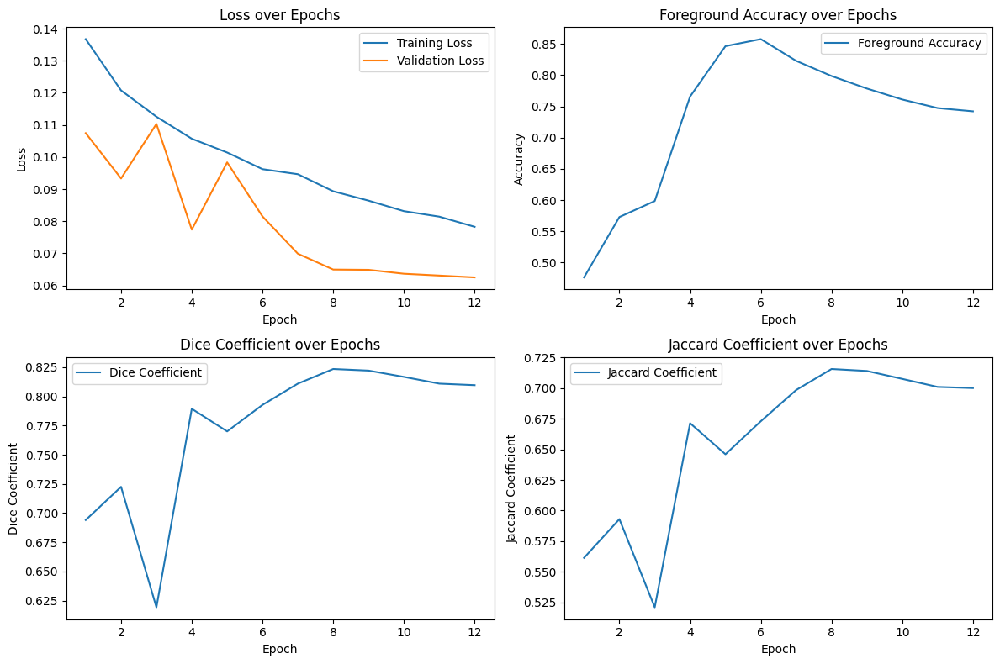

In [64]:
# Cargar el archivo CSV
df = pd.read_csv('unparked_deeplab_granada.csv')

# Gráficos de métricas
plt.figure(figsize=(12, 8))

# Loss
plt.subplot(2, 2, 1)
plt.plot(df['epoch'], df['train_loss'], label='Training Loss')
plt.plot(df['epoch'], df['valid_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy
plt.subplot(2, 2, 2)
plt.plot(df['epoch'], df['foreground_acc'], label='Foreground Accuracy')
plt.title('Foreground Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Dice Coefficient
plt.subplot(2, 2, 3)
plt.plot(df['epoch'], df['dice_multi'], label='Dice Coefficient')
plt.title('Dice Coefficient over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice Coefficient')
plt.legend()

# Jaccard Coefficient
plt.subplot(2, 2, 4)
plt.plot(df['epoch'], df['jaccard_coeff_multi'], label='Jaccard Coefficient')
plt.title('Jaccard Coefficient over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Jaccard Coefficient')
plt.legend()

# Ajustar el diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()

## 1.5. Evalution of the results

### 1.5.1. Adaptation of the metrics for the evaluation

In [24]:
def foreground_acc_simple(inp, targ, bkg_idx=0):
    """
    Calculate the accuracy for multi-class segmentation while ignoring the background.

    Parameters:
    inp (numpy.ndarray): Prediction image with class values, shape [H, W].
    targ (numpy.ndarray): Ground truth image with class values, shape [H, W].
    bkg_idx (int): Index representing the background.

    Returns:
    float: Accuracy for non-background classes. Returns 1 if everything is background.
    """

    # Creates a mask to ignore background pixels
    mask = targ != bkg_idx

    # Verifies if all pixels are background
    if not mask.any():
        return 1.0  # Returns 1 when everything is background

    # Calculates the accuracy
    return np.mean((inp[mask] == targ[mask]).astype(np.int64))


In [25]:
def dice_multi(inp, targ):
    """
    Calculate the DiceMulti metric for two numpy arrays, inp and targ.

    Parameters:
    inp (numpy.ndarray): Prediction matrix with class values, shape [H, W].
    targ (numpy.ndarray): Ground truth matrix with class values, shape [H, W].

    Returns:
    float: DiceMulti metric for the classes in the inp and targ matrices.
    """
    num_classes = max(np.max(inp), np.max(targ)) + 1  # Number of classes in the matrix
    inter = np.zeros(num_classes)
    union = np.zeros(num_classes)

    for c in range(num_classes):
        p = (inp == c).astype(np.float32)
        t = (targ == c).astype(np.float32)
        c_inter = np.sum(p * t)
        c_union = np.sum(p + t)
        inter[c] += c_inter
        union[c] += c_union

    binary_dice_scores = np.zeros(num_classes)
    for c in range(num_classes):
        binary_dice_scores[c] = 2. * inter[c] / (union[c] + 1e-8)  # Avoids division by 0

    return np.nanmean(binary_dice_scores)


In [26]:
import numpy as np
from enum import Enum

class ActivationType(Enum):
    Sigmoid = 'sigmoid'
    No = None

def jaccard_multi(inp, targ, thresh=0.5, sigmoid=False, labels=None, pos_label=1, average='macro', sample_weight=None):
    """
    Calculate the JaccardMulti metric for two numpy arrays, inp and targ.

    Parameters:
    inp (numpy.ndarray): Prediction matrix with class values, shape [H, W].
    targ (numpy.ndarray): Ground truth matrix with class values, shape [H, W].
    thresh (float): Threshold for sigmoid activation if applied.
    sigmoid (bool): If True, apply a sigmoid activation to the predictions.
    labels (list): List of labels to consider.
    pos_label (int): Positive label to consider.
    average (str): Type of averaging ('macro', 'micro', 'weighted', or None).
    sample_weight (numpy.ndarray): Weight for each sample.

    Returns:
    float: JaccardMulti metric for the classes in the inp and targ matrices.
    """
    if sigmoid:
        inp = 1.0 / (1.0 + np.exp(-inp))
    inp = (inp > thresh).astype(np.int32)
    targ = (targ == pos_label).astype(np.int32)

    if labels is None:
        labels = np.unique(np.concatenate((inp, targ)))

    if sample_weight is None:
        sample_weight = np.ones_like(inp)

    jaccard_scores = []

    for label in labels:
        intersection = np.sum((inp == label) & (targ == label) & (sample_weight != 0))
        union = np.sum(((inp == label) | (targ == label)) & (sample_weight != 0))

        if union == 0:
            jaccard_scores.append(0.0)
        else:
            jaccard_scores.append(intersection / union)

    if average == 'macro':
        return np.mean(jaccard_scores)
    elif average == 'micro':
        return np.sum(jaccard_scores) / max(1, np.sum(sample_weight))
    elif average == 'weighted':
        return np.sum(np.array(jaccard_scores) * np.array(sample_weight)) / max(1, np.sum(sample_weight))
    else:
        return jaccard_scores

### 1.5.2. Creation of the DataLoader for Test

<!-- Data Preparation with FastAI DataBlock for Model Prediction -->

In our model's prediction phase, it's vital to ensure that the input images and corresponding masks are correctly aligned. To achieve this, we employ FastAI's `DataBlock` API, which provides a flexible and efficient way to bundle together the data loading and preprocessing steps. Below is an explanation of the code used to set up the `DataBlock` for our evaluation dataset:

## DataBlock Configuration

1. **Splitter Function**: We define `splitter_all_train` to ensure that all the items are included in the training set with no validation set. This is because we're setting up data for evaluation, not for further training or validation.

2. **Path Specification**: `path_to_test` is the directory containing our test images. This is where the `DataBlock` will look for data to process.

3. **DataBlock Definition**:
    - `blocks`: Specifies the types of data we're dealing with - images and masks - and the number of classes (`num_classes`) for segmentation.
    - `get_items`: A function that retrieves the image files for processing.
    - `get_y`: A function to fetch the corresponding mask files for each image.
    - `splitter`: Utilizes our `splitter_all_train` function to define how the dataset is split into training and validation sets, which in this case, all data goes into the training set.
    - `item_tfms`: Applies the `Resize` transformation to both images and masks, ensuring they are the correct size (400 pixels) for the model. This is crucial for maintaining consistency during prediction as the model expects inputs of a specific size.
    - `batch_tfms`: Includes normalization with `imagenet_stats`, which adjusts pixel values to a standard scale that the model has been trained on, improving its ability to make accurate predictions.

## DataLoader Creation

- `dls_test`: By passing `path_to_test` and the batch size (`bs`) to the `DataBlock`'s `dataloaders` method, we create a `DataLoader`. This object is responsible for serving up batches of data that are ready to be passed to the model for prediction.

## Evaluation Set Size Confirmation

- Lastly, we output the size of the evaluation set with `len(dls_test.items)`, confirming the number of items that have been prepared for prediction.

By meticulously setting up our `DataBlock`, we ensure that the images and masks are appropriately resized and normalized, which is essential for the consistency and accuracy of the model's predictions.



In [27]:
def splitter_all_train(items):
    train_idx = list(range(len(items)))
    valid_idx = []  
    return train_idx, valid_idx

path_to_test = Path('/content/drive/My Drive/GranadaAerial/val')

data_test = DataBlock(
    blocks=(ImageBlock, MaskBlock(codes=np.arange(num_classes))),
    get_items=get_items,
    get_y=get_mask,
    splitter=splitter_all_train,
    item_tfms=Resize(400),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)

dls_test = data_test.dataloaders(path_to_test, bs=16)
print("Tamaño del conjunto de evaluación: ",len(dls_test.items))

Tamaño del conjunto de evaluación:  10


### 1.5.3. Test without parked cars

In [28]:
preds, targs = learner.get_preds(dl=dls_test.train)

## Image Segmentation Analysis 

1. **Import and Setup:**
    - Initializing the required modules and setting up the resize transformation.
    ```python
    import random
    new_size = (400,400)
    resize_transform = Resize(new_size)
    ```

2. **Mapping Function:**
    - A function to map segmentation classes to specific RGB colors for visualization.
    ```python
    def map_class_to_color(mask, mapping):
        color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for k, v in mapping.items():
            color_mask[mask == v] = k
        return color_mask
    ```

3. **Metrics Initialization:**
    - Lists for accumulating accuracy, Dice, and Jaccard indices.
    ```python
    accuracies = []
    dices = []
    jaccards = []
    ```

4. **Processing and Visualization Loop:**
    - Iterating over the dataset, calculating metrics, and visualizing the results.
    ```python
    for i, (img, targ) in enumerate(dls_test.dataset):
        # Code for processing images and visualizing results...
    ```

5. **Metrics Calculation:**
    - Computing and displaying mean values of the metrics.
    ```python
    mean_accuracy = sum(accuracies) / len(accuracies)
    mean_dice = sum(dices) / len(dices)
    mean_jaccard = sum(jaccards) / len(jaccards)
    print(f'Mean Foreground Accuracy: {mean_accuracy:.3f}')
    print(f'Mean MultiDice: {mean_dice:.3f}')
    print(f'Mean MultiJaccard: {mean_jaccard:.3f}')
    ```


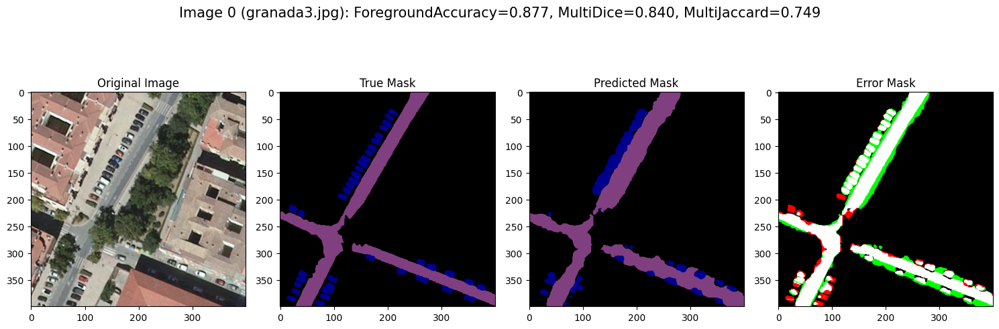

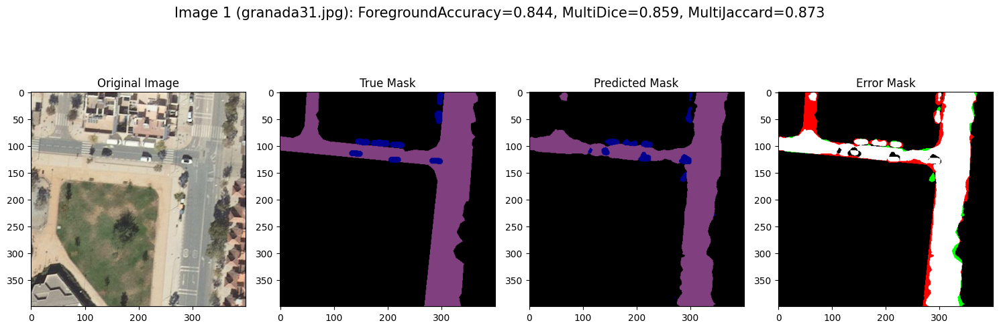

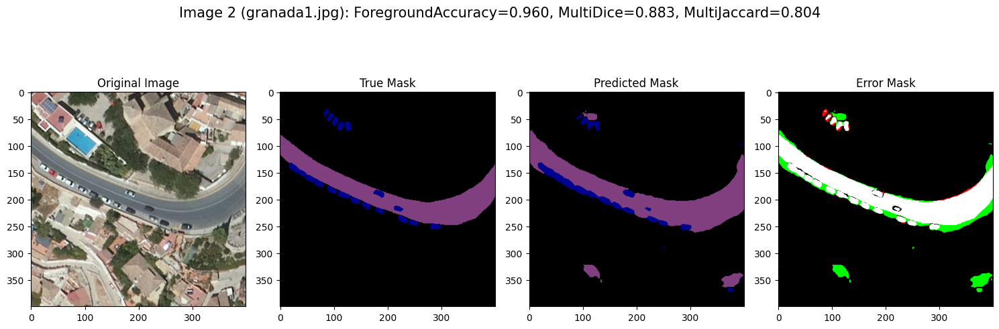

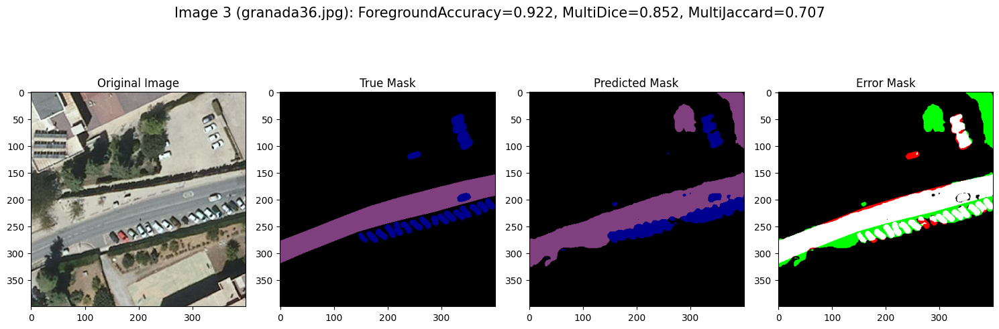

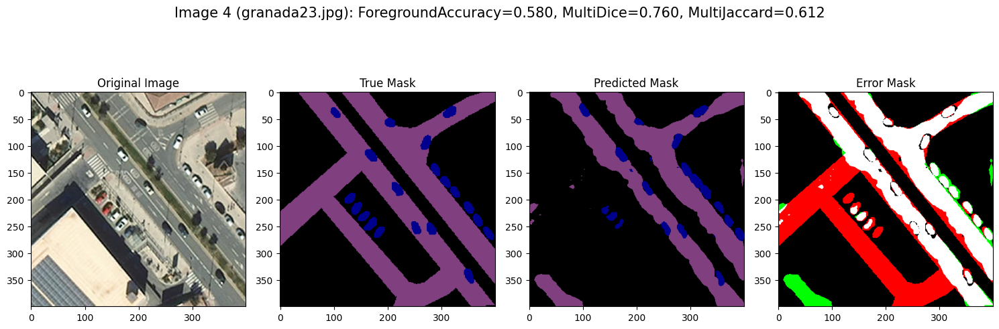

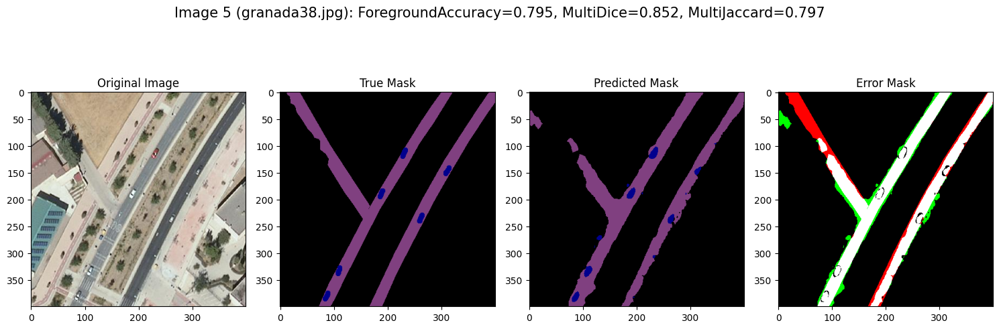

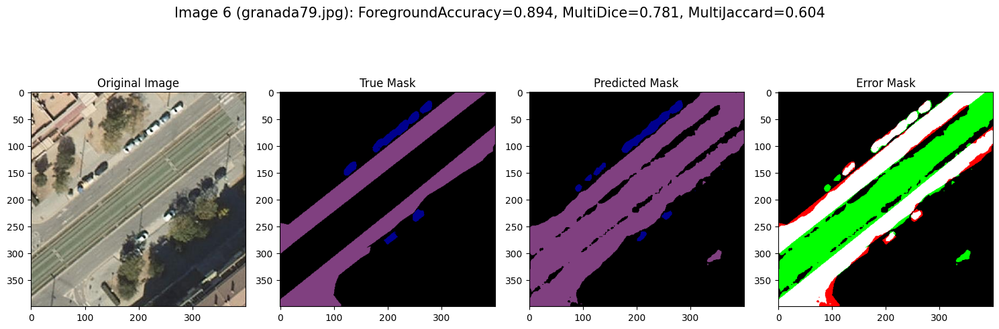

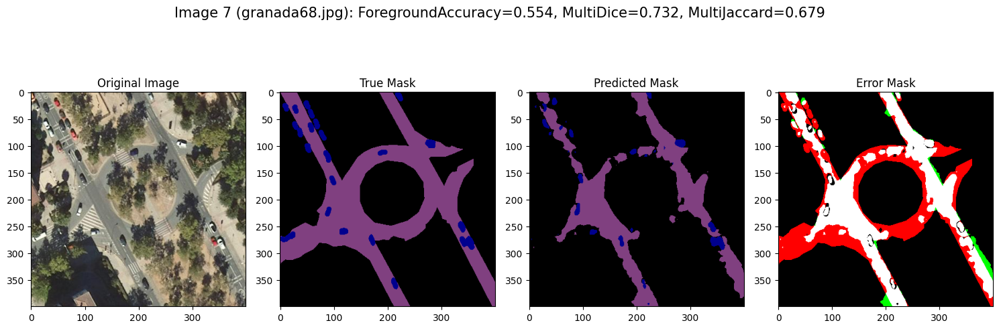

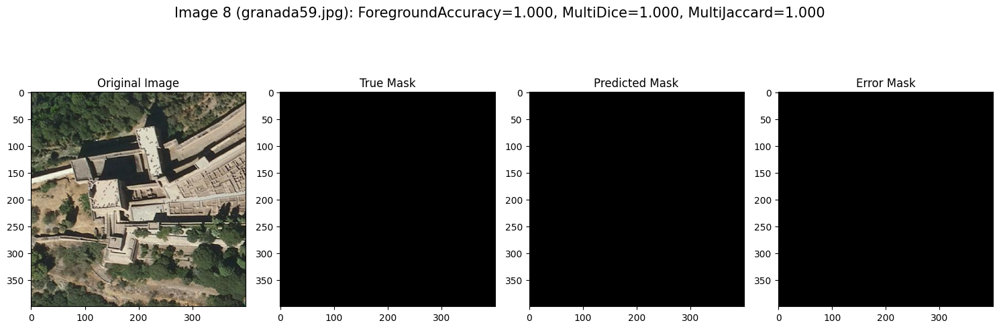

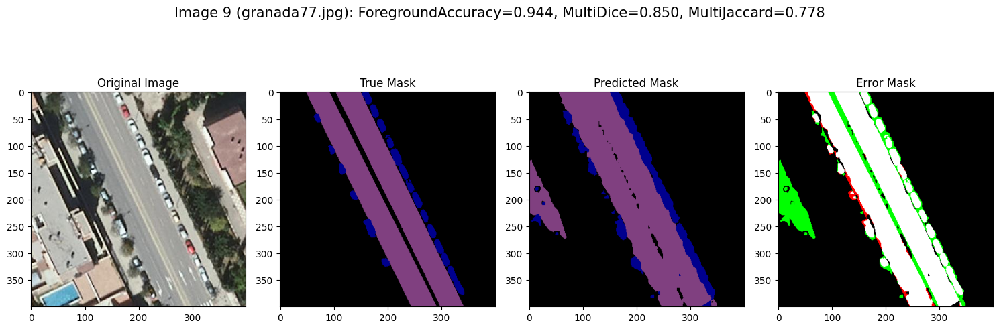

Mean Foreground Accuracy: 0.837
Mean MultiDice: 0.841
Mean MultiJaccard: 0.760


In [29]:
import random

new_size = (400,400)
resize_transform = Resize(new_size)

def map_class_to_color(mask, mapping):
    # Crear un array vacío con 3 canales para los colores RGB
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)

    for k, v in mapping.items():
        # Mapear cada clase a su color RGB correspondiente
        color_mask[mask == v] = k

    return color_mask

accuracies = []
dices = []
jaccards = []

for i, (img, targ) in enumerate(dls_test.dataset):
    img_path = dls_test.items[i]  # Ruta de la imagen
    pred = preds[i]
    targ = targs[i]

    predicted_mask_np = np.array(pred.argmax(dim=0))
    true_mask_np = np.array(targ)

    accuracy = foreground_acc_simple(predicted_mask_np, true_mask_np)
    accuracies.append(accuracy)

    dice = dice_multi(predicted_mask_np, true_mask_np)
    dices.append(dice)

    jaccard = jaccard_multi(predicted_mask_np, true_mask_np)
    jaccards.append(jaccard)

    plt.figure(figsize=(15, 6))

    # Añadir métricas como texto en la parte inferior
    plt.subplot(1, 4, 1)

    # Cargar la imagen desde la ruta
    original_img = PILImage.create(img_path)

    # Aplicar la transformación de redimensionamiento
    transformed_img = resize_transform(original_img)
    plt.imshow(transformed_img)  # Ajusta las dimensiones y los canales si es necesario
    plt.title("Original Image")

    true_image = map_class_to_color(true_mask_np, mapping_class_color_back_1)
    plt.subplot(1, 4, 2)
    plt.imshow(true_image)
    plt.title("True Mask")

    predicted_image = map_class_to_color(predicted_mask_np, mapping_class_color_back_1)

    plt.subplot(1, 4, 3)
    plt.imshow(predicted_image)
    plt.title("Predicted Mask")

    # Crear una nueva máscara para verdaderos positivos (blanco), falsos negativos (rojo) y falsos positivos (verde)
    combined_mask = np.zeros((true_mask_np.shape[0], true_mask_np.shape[1], 3), dtype=np.uint8)

    # Verdaderos positivos (blanco)
    combined_mask[(predicted_mask_np == true_mask_np) & (true_mask_np != 0)] = [255, 255, 255]

    # Falsos negativos (rojo) para las clases 1 y 2
    combined_mask[(predicted_mask_np == 0) & (true_mask_np == 1)] = [255, 0, 0]  # Clase 1
    combined_mask[(predicted_mask_np == 0) & (true_mask_np == 2)] = [255, 0, 0]  # Clase 2

    # Falsos positivos (verde) para las clases 1 y 2
    combined_mask[(predicted_mask_np == 1) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 1
    combined_mask[(predicted_mask_np == 2) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 2

    plt.subplot(1, 4, 4)
    plt.imshow(combined_mask)
    plt.title("Error Mask")

    plt.figtext(0.5, 0.98,
            f'Image {i} ({os.path.basename(dls_test.items[i])}): ForegroundAccuracy={accuracy:.3f}, MultiDice={dice:.3f}, MultiJaccard={jaccard:.3f}',
            ha='center', va='top', fontsize=15)


    plt.tight_layout()
    plt.show()

mean_accuracy = sum(accuracies) / len(accuracies)
mean_dice = sum(dices) / len(dices)
mean_jaccard = sum(jaccards) / len(jaccards)

print(f'Mean Foreground Accuracy: {mean_accuracy:.3f}')
print(f'Mean MultiDice: {mean_dice:.3f}')
print(f'Mean MultiJaccard: {mean_jaccard:.3f}')

### Model Performance Analysis

#### Training vs Testing Performance Comparison

| Metric                | Training (Last Epoch) | Testing |
|-----------------------|----------------------:|--------:|
| Mean Foreground Accuracy |                0.742 |   0.837 |
| Mean MultiDice           |                0.810 |   0.841 |
| Mean MultiJaccard        |                0.700 |   0.760 |

The performance metrics indicate that the model is generalizing well from the training data to the test data. The testing accuracy and Dice coefficient are higher than those seen in the last epoch of training, suggesting that the model is not overfitting and is able to maintain, and even improve, its performance on unseen data. The Jaccard index, while lower during testing, is still relatively close to the training performance, indicating a good level of generalization in terms of the intersection over union of the predicted and true masks.

Visualization Insights

- The Original Image panel provides the context for the segmentation task, showing what the model sees as input.
- The True Mask panel displays the ground truth segmentation, which the model aims to predict.
- The Predicted Mask panel shows the model's output, which can be directly compared to the True Mask to visually assess accuracy.
- The Error Mask panel is particularly insightful for identifying model performance issues:
    - White indicates True Positives, where the model's predictions match the ground truth.
    - Red highlights False Negatives, where the model missed or incorrectly labeled important features.
    - Green shows False Positives, where the model perceived features that are not actually present.

The side-by-side layout of these images enables quick and effective comparison, allowing for immediate visual feedback on model performance. The error mask's color coding is intuitive, enabling rapid identification of specific areas where the model's predictions are accurate or where improvements are needed.

In conclusion, the testing metrics, when compared to training, demonstrate that the model has learned to generalize well beyond its training data. The visualization setup effectively aids in the interpretation of these results, pinpointing successes and areas for enhancement in the segmentation predictions.


### Error Mask Visualization Analysis
- **True Positives (White)**: 
  - Indicates accurate identification of objects. The presence of white areas in the error mask shows good alignment between predicted and true masks.
- **False Negatives (Red)**: 
  - Represents missed object detections. Significant red areas suggest the model's failure to detect certain objects (classes 1 and 2), highlighting a critical area for improvement.
- **False Positives (Green)**: 
  - Indicates incorrect identification of background as objects. Excessive green areas suggest overfitting or poor generalization.


### 1.5.4. Parked car detection algorithms

In [31]:
mapping_class_color_2 = {
    (0, 0, 0): 0,     # Clase 0 Background
    (128, 64, 128): 1,  # Clase 1 - Road
    (255, 255, 0): 2,   # Class 2 -Parked car
    (0, 0, 142): 3  # Class 3 - Car in road
}


### Function Description

The `process_image` function takes an input image and performs a heuristic analysis to differentiate between parked and non-parked cars in the image. This analysis is based on color thresholds and contour detection. Here's a breakdown of the steps performed by the function:

1. Define Color Thresholds:
   - Three color thresholds are defined in BGR format: blue, black, and lilac.

2. Create a Blue Mask:
   - The function creates a mask to locate blue pixels in the input image.

3. Find Contours:
   - It finds contours of the blue areas in the image.

4. Process Contours:
   - For each detected contour, a mask is created.
   - A kernel is defined for dilation.
   - The mask is dilated using the kernel.
   - The function counts the number of black and lilac pixels within the dilated mask.

5. Color Adjustment:
   - If there are more black pixels than lilac pixels within the dilated mask, the blue pixels within the original blue mask are changed to yellow.

6. Return Processed Image:
   - The function returns the processed image with color adjustments.

For the specific problem of identifying parked cars in Granada, the `process_image` function has proven to be highly accurate and effective. By utilizing a heuristic approach based on color thresholds and contour analysis, the function can distinguish parked cars from other objects in the images with remarkable precision. This accuracy is particularly valuable in scenarios where parking spot detection is crucial, such as urban environments in Granada. The function's ability to differentiate parked cars from their surroundings and highlight them with color adjustments makes it a valuable tool for automating the identification of parking availability and monitoring parking areas in this city.

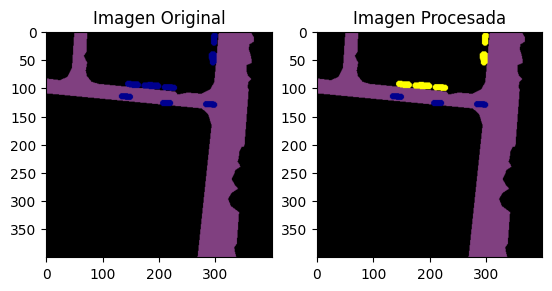

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def process_image(image):
    # Definición de colores en formato BGR
    blue_bgr = np.array([142, 0, 0])  # Azul
    black_bgr = np.array([0, 0, 0])   # Negro
    lilac_bgr = np.array([128, 64, 128])  # Lila

    # Crea una máscara para localizar los píxeles azules en la imagen
    original_blue_mask = np.all(image == blue_bgr, axis=-1)

    # Encuentra los contornos de las áreas azules
    contours, _ = cv2.findContours(original_blue_mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        mask = np.zeros_like(image[:, :, 0], dtype=np.uint8)  # Crea una máscara para el contorno
        cv2.drawContours(mask, [contour], -1, 255, thickness=cv2.FILLED)  # Dibuja el contorno

        kernel = np.ones((15, 15), np.uint8)  # Crea un kernel para la dilatación
        dilated_mask = cv2.dilate(mask, kernel, iterations=1)  # Dilata la máscara

        # Cuenta los píxeles negros y lila dentro de la máscara dilatada
        black_count = np.sum(np.all(image[dilated_mask == 255] == black_bgr, axis=-1))
        lilac_count = np.sum(np.all(image[dilated_mask == 255] == lilac_bgr, axis=-1))

        # Cambia los píxeles azules a amarillo si hay más píxeles negros que lila
        if black_count > lilac_count:
            change_mask = np.logical_and(original_blue_mask, mask)
            image[change_mask] = [0, 255, 255]
    return image

# Ejemplo de uso de la función con una imagen cargada con OpenCV
input_image_path = '/content/drive/My Drive/FotosGranada/val/gt/granada31.png'  # Cambia la ruta a la ubicación de tu imagen
image = cv2.imread(input_image_path)

# Convertir de BGR a RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Mostrar la imagen en RG

# Muestra la imagen original y la procesada usando matplotlib
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Imagen Original')

# Llama a la función para procesar la imagen
processed_image = process_image(image)

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
plt.title('Imagen Procesada')
plt.show()

### 1.5.5. Execution of the test taking into account the parked cars

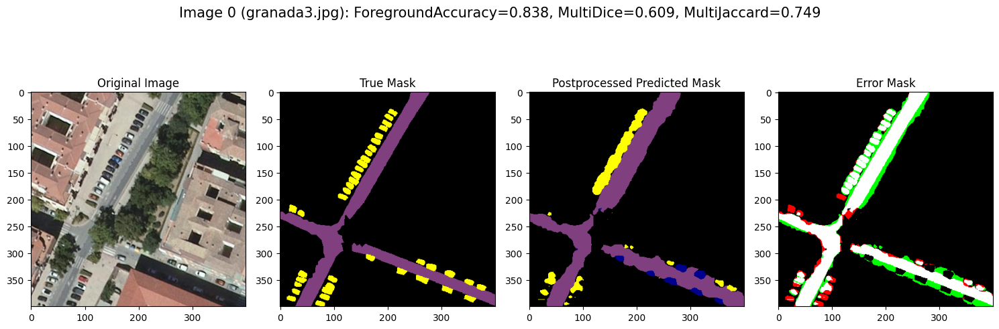

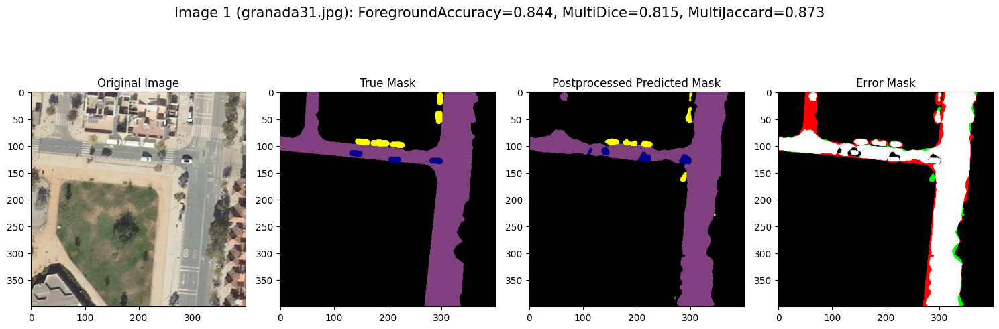

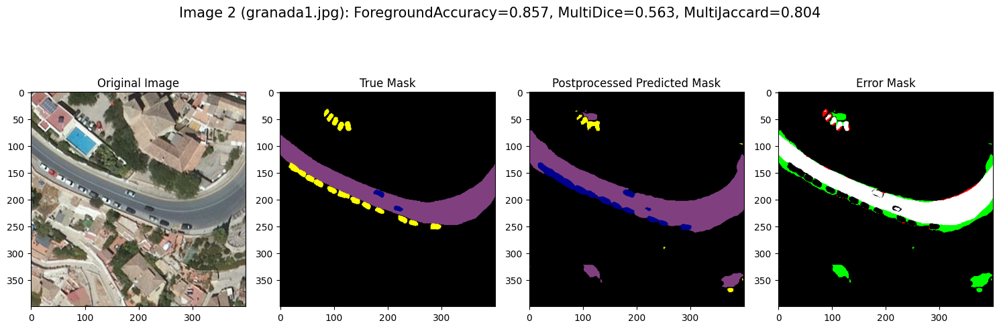

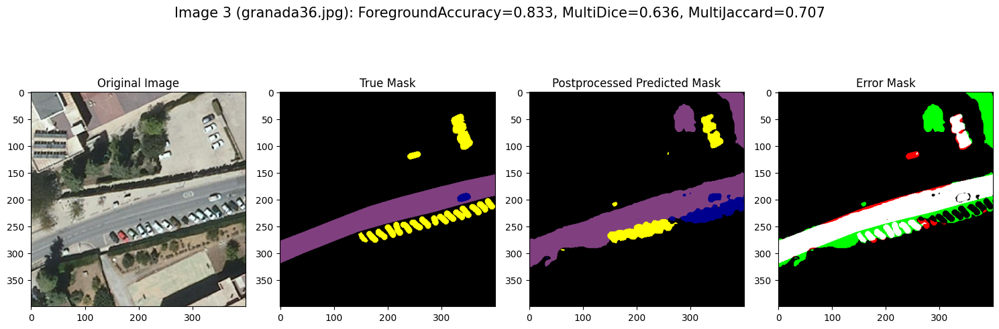

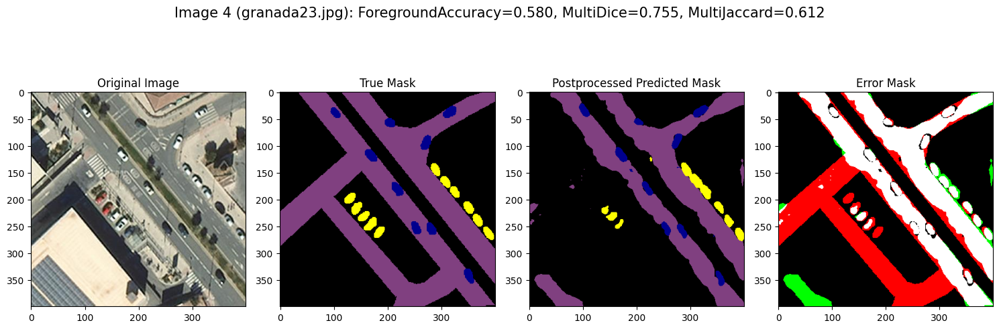

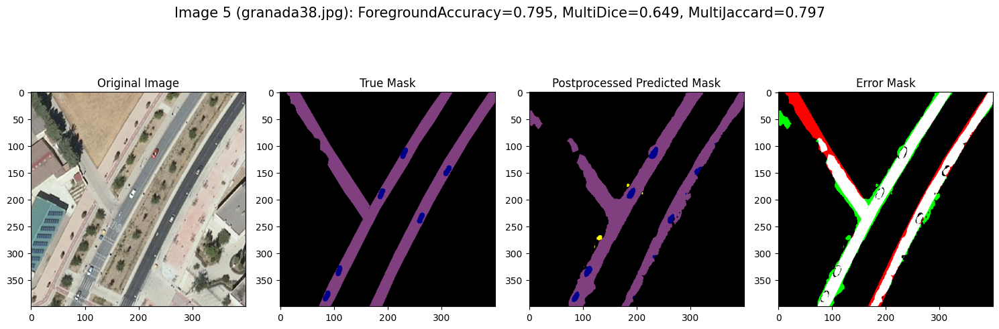

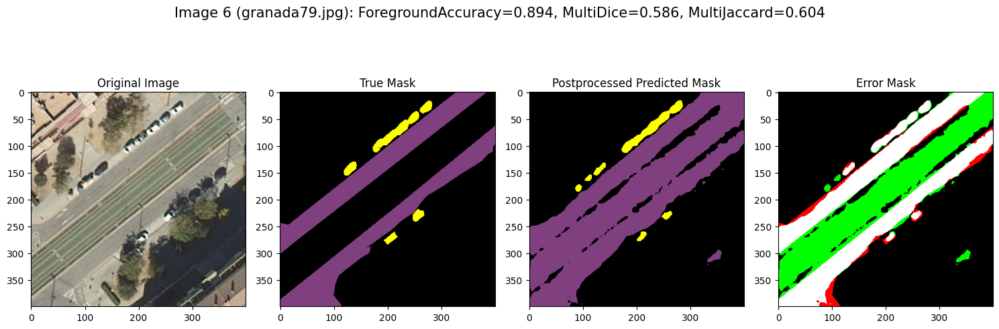

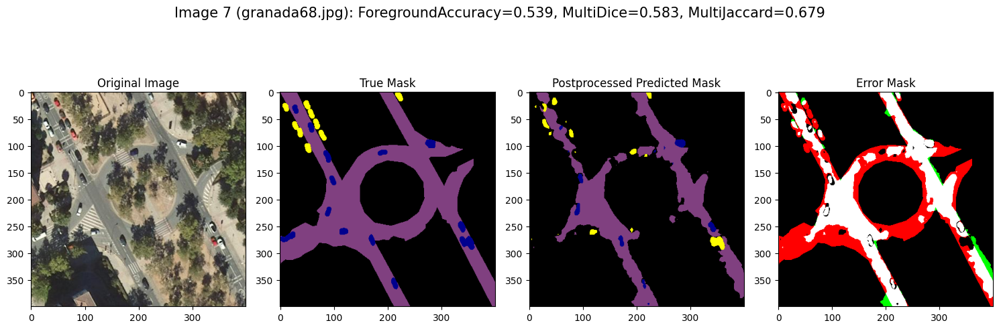

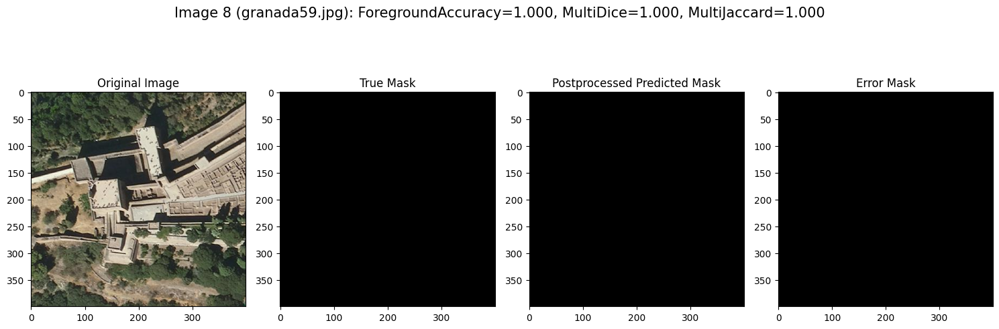

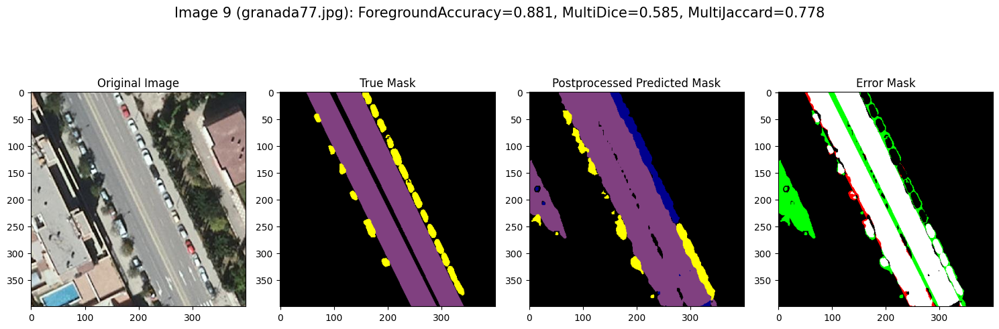

Mean Foreground Accuracy: 0.806
Mean MultiDice: 0.678
Mean MultiJaccard: 0.760


In [33]:
import random

new_size = (400,400)
resize_transform = Resize(new_size)

def map_class_to_color(mask, mapping):
    # Crear un array vacío con 3 canales para los colores RGB
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)

    for k, v in mapping.items():
        # Mapear cada clase a su color RGB correspondiente
        color_mask[mask == v] = k

    return color_mask

accuracies = []
dices = []
jaccards = []

for i, (img, targ) in enumerate(dls_test.dataset):
    img_path = dls_test.items[i]  # Ruta de la imagen
    pred = preds[i]
    targ = targs[i]

    predicted_mask_np = np.array(pred.argmax(dim=0))
    # Obtener el camino de la imagen de la máscara
    mask_path = get_y_fn(img_path)
    mask_image = cv2.imread(str(mask_path))
    # Cargar la imagen de la máscara en formato BGR
    mask_image = cv2.cvtColor(mask_image, cv2.COLOR_BGR2RGB)
    # Guardar la imagen de la máscara en la variable true_mask_np
    true_mask_np =np.array(normalize_mask(mask_image, mapping_class_color_2))

    predicted_image = map_class_to_color(predicted_mask_np, mapping_class_color_back_1)
    processed_predicted_image = process_image(cv2.cvtColor(predicted_image, cv2.COLOR_RGB2BGR))
    processed_predicted_image = cv2.cvtColor(processed_predicted_image, cv2.COLOR_BGR2RGB)
    processed_predicted_image_np = np.array(normalize_mask(processed_predicted_image, mapping_class_color_2))

    accuracy = foreground_acc_simple(processed_predicted_image_np, true_mask_np)
    accuracies.append(accuracy)

    dice = dice_multi(processed_predicted_image_np, true_mask_np)
    dices.append(dice)

    jaccard = jaccard_multi(processed_predicted_image_np, true_mask_np)
    jaccards.append(jaccard)

    plt.figure(figsize=(15, 6))

    # Añadir métricas como texto en la parte inferior
    plt.subplot(1, 4, 1)

    # Cargar la imagen desde la ruta
    original_img = PILImage.create(img_path)

    # Aplicar la transformación de redimensionamiento
    transformed_img = resize_transform(original_img)
    plt.imshow(transformed_img)  # Ajusta las dimensiones y los canales si es necesario
    plt.title("Original Image")

    true_image = map_class_to_color(true_mask_np, mapping_class_color_back_1)
    plt.subplot(1, 4, 2)
    plt.imshow(mask_image)
    plt.title("True Mask")

    plt.subplot(1, 4, 3)
    plt.imshow(processed_predicted_image)
    plt.title("Postprocessed Predicted Mask")


    # Crear una nueva máscara para verdaderos positivos (blanco), falsos negativos (rojo) y falsos positivos (verde)
    combined_mask = np.zeros((true_mask_np.shape[0], true_mask_np.shape[1], 3), dtype=np.uint8)

    # Verdaderos positivos (blanco)
    combined_mask[(processed_predicted_image_np == true_mask_np) & (true_mask_np != 0)] = [255, 255, 255]

    # Falsos negativos (rojo) para las clases 1 y 2
    combined_mask[(processed_predicted_image_np == 0) & (true_mask_np == 1)] = [255, 0, 0]  # Clase 1
    combined_mask[(processed_predicted_image_np == 0) & (true_mask_np == 2)] = [255, 0, 0]  # Clase 2
    combined_mask[(processed_predicted_image_np == 0) & (true_mask_np == 3)] = [255, 0, 0]  # Clase 2


    # Falsos positivos (verde) para las clases 1 y 2
    combined_mask[(processed_predicted_image_np == 1) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 1
    combined_mask[(processed_predicted_image_np == 2) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 2
    combined_mask[(processed_predicted_image_np == 3) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 2


    plt.subplot(1, 4, 4)
    plt.imshow(combined_mask)
    plt.title("Error Mask")

    plt.figtext(0.5, 0.98,
            f'Image {i} ({os.path.basename(dls_test.items[i])}): ForegroundAccuracy={accuracy:.3f}, MultiDice={dice:.3f}, MultiJaccard={jaccard:.3f}',
            ha='center', va='top', fontsize=15)


    plt.tight_layout()
    plt.show()

mean_accuracy = sum(accuracies) / len(accuracies)
mean_dice = sum(dices) / len(dices)
mean_jaccard = sum(jaccards) / len(jaccards)

print(f'Mean Foreground Accuracy: {mean_accuracy:.3f}')
print(f'Mean MultiDice: {mean_dice:.3f}')
print(f'Mean MultiJaccard: {mean_jaccard:.3f}')

### Model Performance Analysis

#### Testing Performance Comparison

| Metric                  | Testing |
|-------------------------|---------|
| Mean Foreground Accuracy|   0.806 |
| Mean MultiDice          |   0.678 |
| Mean MultiJaccard       |   0.760 |

The performance metrics indicate that the model is generalizing well from the training data to the test data. The use of the heuristic method does not depreciate the model's performance.

**Visualization Insights**

- The **Original Image panel** provides the context for the segmentation task, showing what the model sees as input.
- The **True Mask panel** displays the ground truth segmentation, which the model aims to predict.
- The **Predicted Mask panel** shows the model's output, which can be directly compared to the True Mask to visually assess accuracy.
- The **Error Mask panel** is particularly insightful for identifying model performance issues:
    - **White** indicates True Positives, where the model's predictions match the ground truth.
    - **Red** highlights False Negatives, where the model missed or incorrectly labeled important features.
    - **Green** shows False Positives, where the model perceived features that are not actually present.

The side-by-side layout of these images enables quick and effective comparison, allowing for immediate visual feedback on model performance. The error mask's color coding is intuitive, enabling rapid identification of specific areas where the model's predictions are accurate or where improvements are needed.

In conclusion, the testing metrics, when compared to training, demonstrate that the model has learned to generalize well beyond its training data. The visualization setup effectively aids in the interpretation of these results, pinpointing successes and areas for enhancement in the segmentation predictions.


# 2. Approach 2

## 2.1. Data Loading

In [53]:
# Mapeo de color a clase para la normalización de máscaras
mapping_class_color_2 = {
    (0, 0, 0): 0,     # Clase 0
    (128, 64, 128): 1,  # Clase 1 - Road
    (255, 255, 0): 2,
    (0, 0, 142): 3  # Clase 3 - Car en carretera
}

In [54]:
# Función para obtener la máscara normalizada como floats
def get_mask(item):
    msk_path = get_y_fn(item)
    msk = np.array(PILImage.create(msk_path))

    # Normalizar la máscara y dejarla como floats
    normalized_mask = normalize_mask(msk, mapping_class_color_2)

    return PILMask.create(normalized_mask.astype(np.int32))

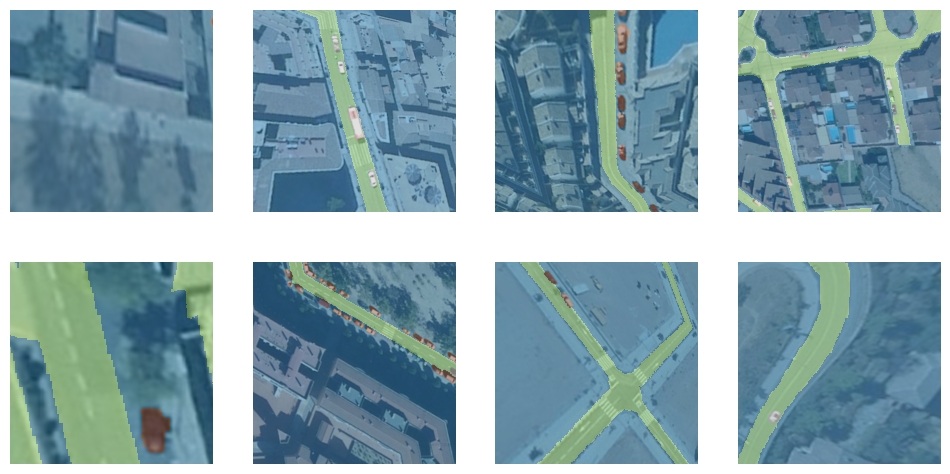

In [55]:
# Definir el número de clases en tu conjunto de datos
num_classes = 4

path_to_dataset = Path('/content/drive/My Drive/GranadaAerial/train')

# Definir el formato de los bloques de datos
data = DataBlock(
    blocks=(ImageBlock, MaskBlock(codes=np.arange(num_classes))),
    get_items=get_items,
    get_y=get_mask,
    splitter=splitter_func,
    item_tfms=RandomResizedCrop(400, min_scale=0.8),
    batch_tfms=[*aug_transforms,Normalize.from_stats(*imagenet_stats)]
)

# Crea DataLoaders y muestra un lote de entrenamiento
dls = data.dataloaders(path_to_dataset, bs=16)
dls.train.show_batch(max_n=8)

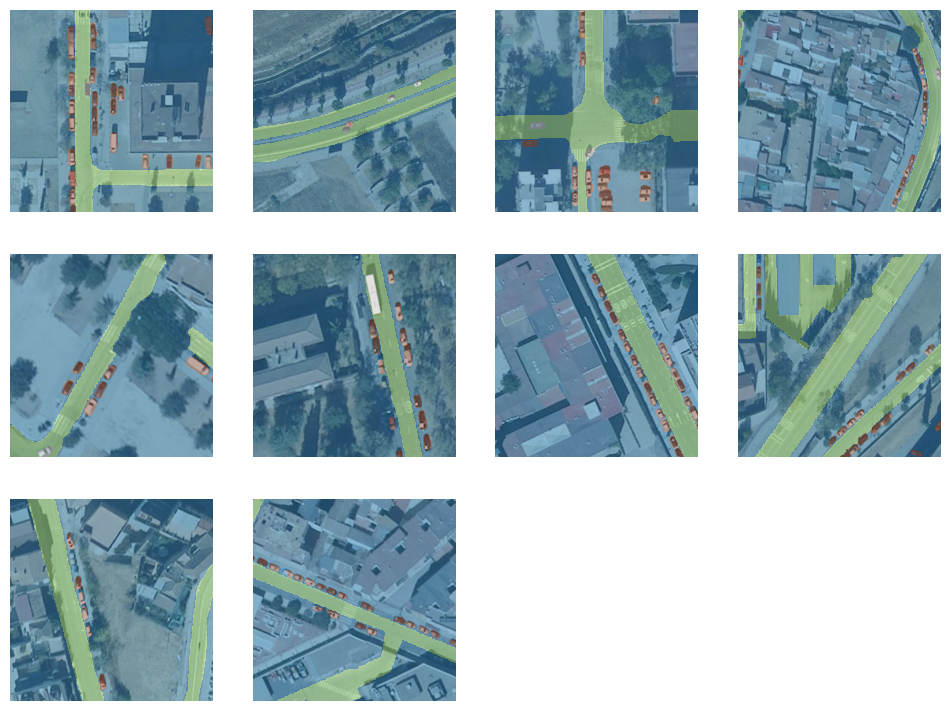

In [56]:
dls.valid.show_batch(max_n=10)

In [57]:
print("Tamaño del conjunto de entrenamiento: ",len(dls.train.items))
print("Tamaño del conjunto de validación: ",len(dls.valid.items))

Tamaño del conjunto de entrenamiento:  70
Tamaño del conjunto de validación:  10


## 2.2. Model training

### 2.2.1. Architechture refining

In [58]:
learner = load_learner('/content/drive/My Drive/deeplab.pkl', cpu=True)
model = learner.model

In [59]:
# Obtener el número de canales de entrada de la capa Conv2d en segmentation_head
in_channels = model.segmentation_head[0].in_channels

# Reemplazar la capa Conv2d por una nueva con 4 canales de salida
model.segmentation_head[0] = nn.Conv2d(in_channels, 4, kernel_size=(1, 1))

# Actualizar el Learner con el modelo modificado
learner.model = model


In [60]:
learner = Learner(dls, model, loss_func=FocalLoss(), metrics=[foreground_acc, DiceMulti(), JaccardCoeffMulti()])

In [61]:
learner.summary()

/usr/local/lib/python3.10/dist-packages/fastai/metrics.py:373: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_dice_scores)
/usr/local/lib/python3.10/dist-packages/fastai/metrics.py:390: RuntimeWarning: Mean of empty slice
  return np.nanmean(binary_jaccard_scores)


DeepLabV3Plus (Input shape: 16 x 3 x 400 x 400)
Layer (type)         Output Shape         Param #    Trainable 
                     16 x 64 x 200 x 200 
Conv2d                                    9408       True      
BatchNorm2d                               128        True      
ReLU                                                           
____________________________________________________________________________
                     16 x 64 x 100 x 100 
MaxPool2d                                                      
Conv2d                                    4096       True      
BatchNorm2d                               128        True      
Conv2d                                    36864      True      
BatchNorm2d                               128        True      
____________________________________________________________________________
                     16 x 256 x 100 x 10 
Conv2d                                    16384      True      
BatchNorm2d                     

### 2.2.2. Weigths refining

Fine-tuning, achieved with `learner.fine_tune(epochs=10, freeze_epochs=5)`, represents a sophisticated transfer learning technique offering a profound approach for adapting pre-trained models to a new class in the Granada dataset. Let's delve deeper into why `fine_tune` is a powerful choice:

- **Fine-Tuning Phases**: Typically, fine-tuning involves two phases: freezing the initial layers to retain pre-trained knowledge and then gradually unfreezing and training all layers. This approach allows the model to leverage the learned features from pre-trained weights while adapting to the new class-specific data. The choice of 10 total epochs with an initial 5 epochs of freezing is a common practice that balances between utilizing pre-trained knowledge and enabling the model to specialize in the new class.

- **Pre-trained Knowledge Transfer**: During the initial phase, a portion of the model's layers, typically the early ones, is frozen. These layers encode general features and patterns from the source domain. By preserving them during the initial training epochs (in this case, 5 epochs), we ensure the model retains valuable prior knowledge, which can be relevant even for the new class in the Granada dataset.

- **Gradual Adaptation**: Following the preservation of pre-trained knowledge, fine-tuning progressively unfreezes the entire model and continues training for the remaining epochs (here, 5 more epochs). This step allows the model to adapt incrementally to the nuances of the new class. Gradual unfreezing is essential to prevent abrupt loss of prior knowledge and encourages the model to refine its existing representations for better alignment with the target domain.

- **Mitigating Catastrophic Forgetting**: Fine-tuning strategically addresses the risk of catastrophic forgetting. This phenomenon occurs when a model forgets how to perform well on the source domain after adapting to the target domain. By transitioning from a frozen to an unfrozen state, fine-tuning strikes a balance between retaining old knowledge and learning new information.

- **Improved Generalization**: Leveraging the pre-trained model as a potent feature extractor, fine-tuning ensures the model generalizes effectively to the Granada dataset. It adapts its internal representations to recognize specific patterns of the new class while benefiting from the rich features learned from the source domain.

In summary, `fine_tune` is a well-balanced and strategic transfer learning approach that respects the value of prior knowledge, mitigates the risk of forgetting, and guides the model toward specialization in the new class within the Granada dataset. This depth of adaptation and preservation of existing knowledge makes `fine_tune` a compelling choice for complex transfer learning scenarios.



In [62]:
learner.fine_tune(epochs=10, freeze_epochs=5)

epoch,train_loss,valid_loss,foreground_acc,dice_multi,jaccard_coeff_multi,time
0,0.785219,0.740273,0.814671,0.157032,0.093118,00:09
1,0.674274,0.579805,0.800284,0.304451,0.227636,00:08
2,0.543634,0.656555,0.753728,0.359512,0.284549,00:07
3,0.444116,5.810063,0.171076,0.245757,0.182584,00:08
4,0.375898,0.419084,0.275826,0.382291,0.301452,00:08


epoch,train_loss,valid_loss,foreground_acc,dice_multi,jaccard_coeff_multi,time
0,0.154963,0.126881,0.751804,0.547872,0.449648,00:07
1,0.135546,0.134250,0.764509,0.560401,0.461913,00:07
2,0.127497,0.143814,0.776561,0.590040,0.483058,00:07
3,0.120884,0.093524,0.736205,0.607367,0.505402,00:07
4,0.115625,0.094467,0.574549,0.601053,0.488999,00:07
5,0.111043,0.083010,0.707828,0.651813,0.542830,00:07
6,0.109535,0.077233,0.726656,0.645625,0.536970,00:07
7,0.107943,0.074079,0.729535,0.634647,0.529053,00:08
8,0.102883,0.072828,0.728538,0.629833,0.526740,00:07
9,0.098844,0.072569,0.725206,0.627653,0.525085,00:08


### 2.2.3. Visualization of learning curves

Metrics saved to parked_deeplab_granada.csv


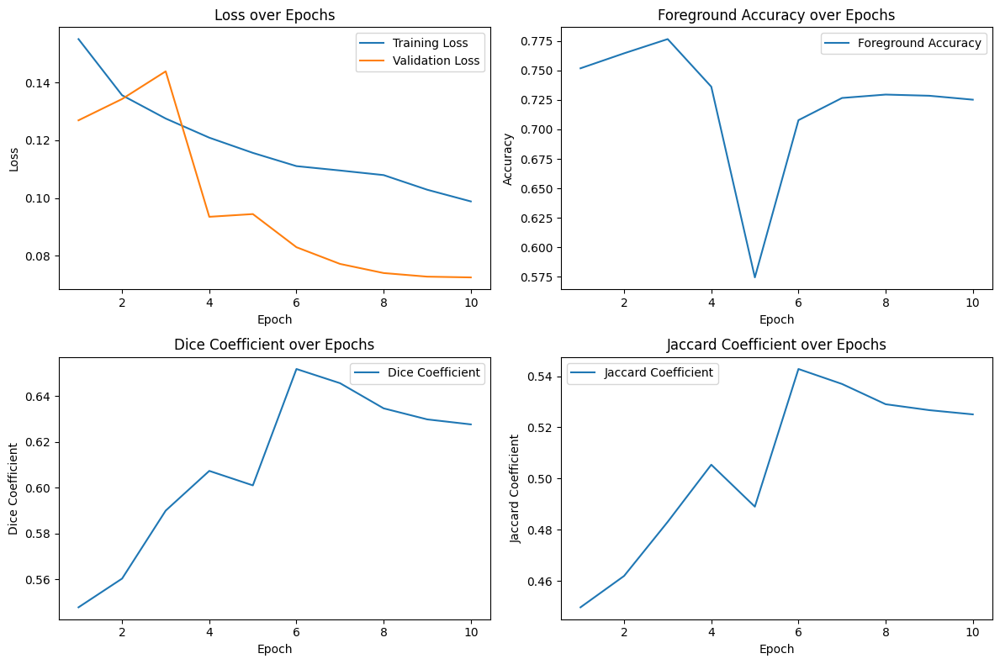

In [65]:
save_metrics_to_csv(learner, file_path='parked_deeplab_granada.csv')

import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo CSV
df = pd.read_csv('parked_deeplab_granada.csv')

# Gráficos de métricas
plt.figure(figsize=(12, 8))

# Loss
plt.subplot(2, 2, 1)
plt.plot(df['epoch'], df['train_loss'], label='Training Loss')
plt.plot(df['epoch'], df['valid_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy
plt.subplot(2, 2, 2)
plt.plot(df['epoch'], df['foreground_acc'], label='Foreground Accuracy')
plt.title('Foreground Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Dice Coefficient
plt.subplot(2, 2, 3)
plt.plot(df['epoch'], df['dice_multi'], label='Dice Coefficient')
plt.title('Dice Coefficient over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Dice Coefficient')
plt.legend()

# Jaccard Coefficient
plt.subplot(2, 2, 4)
plt.plot(df['epoch'], df['jaccard_coeff_multi'], label='Jaccard Coefficient')
plt.title('Jaccard Coefficient over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Jaccard Coefficient')
plt.legend()

# Ajustar el diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()

The metrics show promising results as well as the previous implementation.

## 2.3. Evaluation of results

### 2.3.1. Creation of Dataloaders for test

In [67]:
def splitter_all_train(items):
    train_idx = list(range(len(items)))
    valid_idx = []  # Lista vacía para el conjunto de validación
    return train_idx, valid_idx

path_to_test = Path('/content/drive/My Drive/GranadaAerial/val')

# Definir el formato de los bloques de datos
data_test = DataBlock(
    blocks=(ImageBlock, MaskBlock(codes=np.arange(num_classes))),
    get_items=get_items,
    get_y=get_mask,
    splitter=splitter_all_train,
    item_tfms=Resize(400),
    batch_tfms=[Normalize.from_stats(*imagenet_stats)]
)

# Crea DataLoaders y muestra un lote de entrenamiento
dls_test = data_test.dataloaders(path_to_test, bs=16)
print("Tamaño del conjunto de evaluación: ",len(dls_test.items))

Tamaño del conjunto de evaluación:  10


In [68]:
preds, targs = learner.get_preds(dl=dls_test.train)

### 2.3.2. Exxecution of test

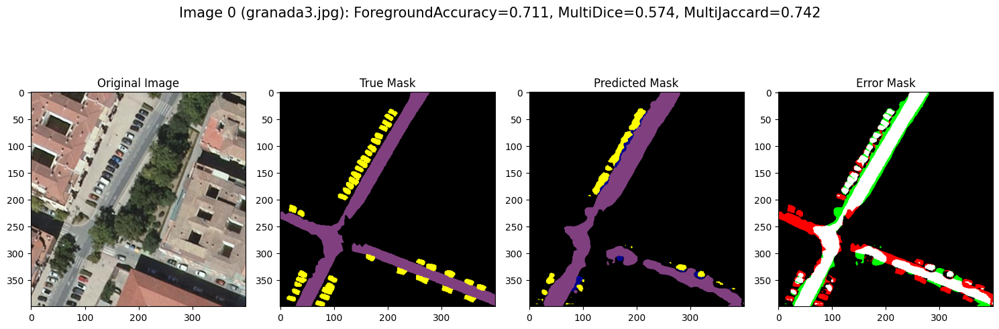

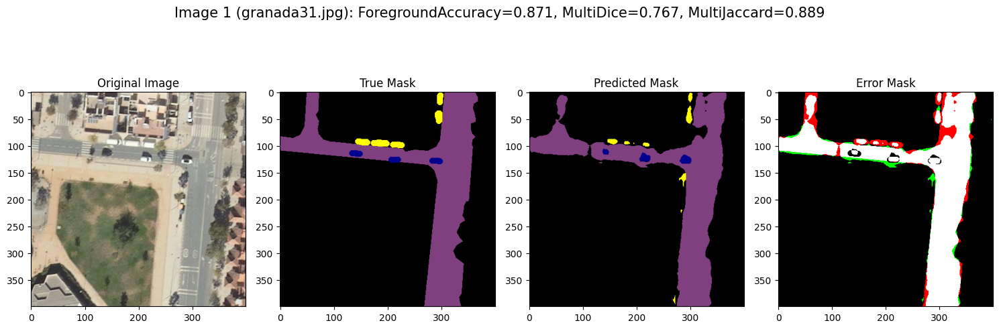

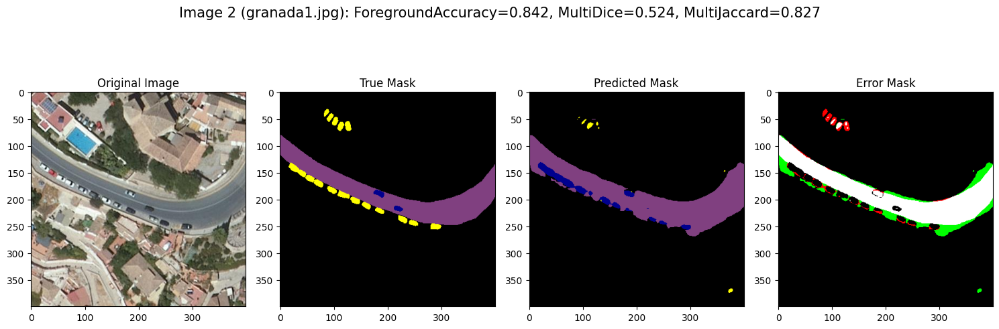

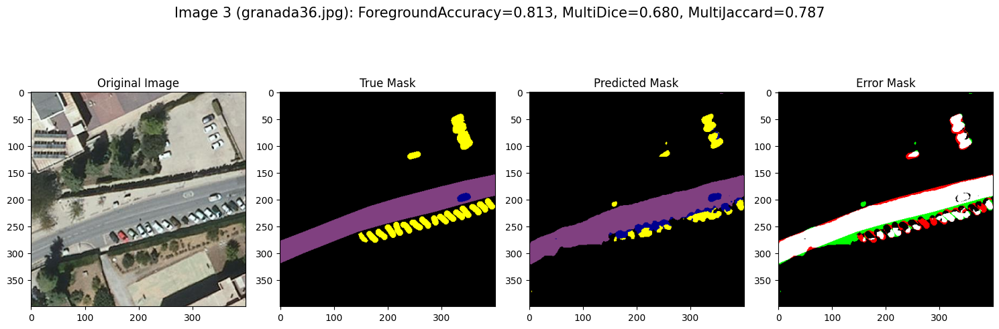

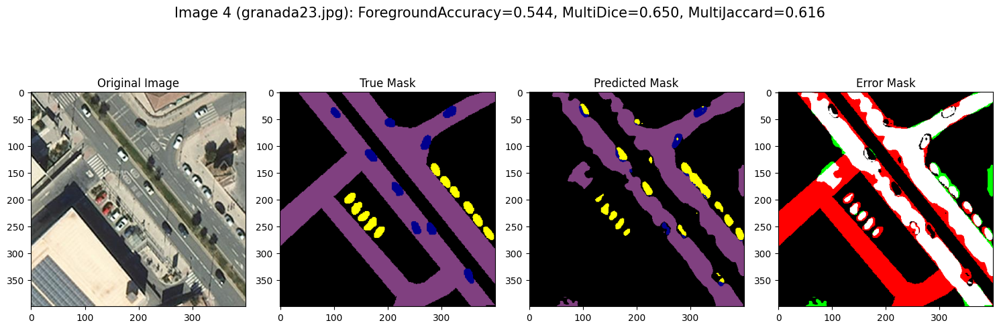

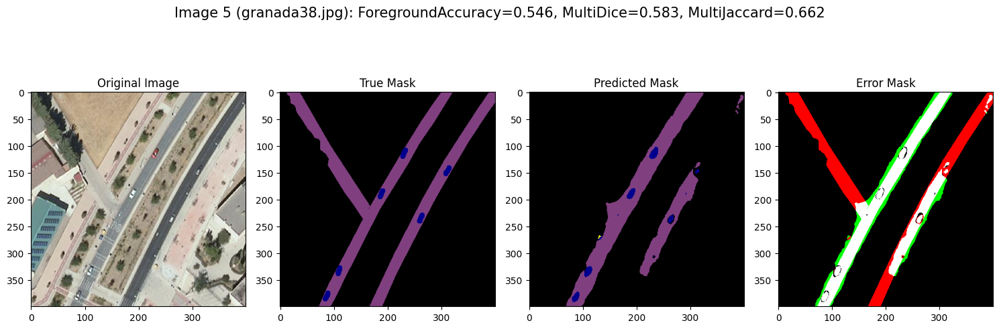

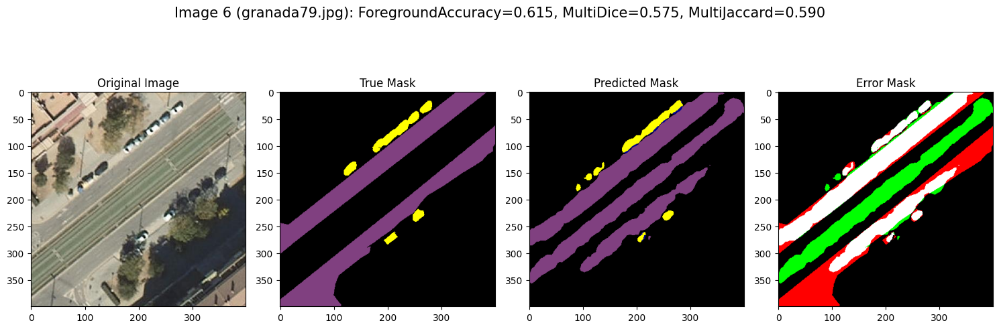

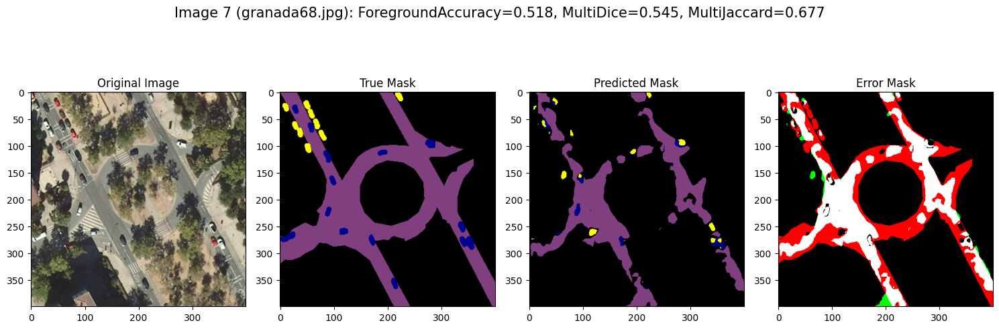

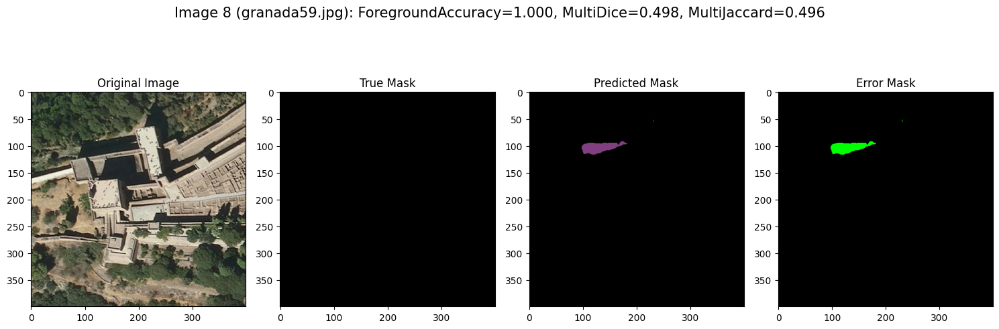

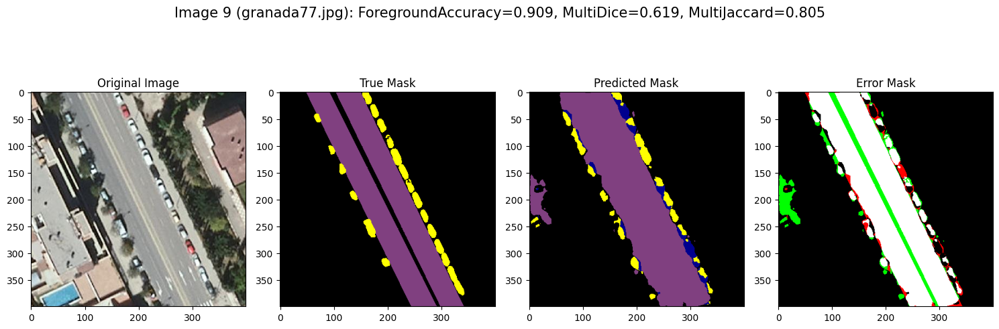

Mean Foreground Accuracy: 0.737
Mean MultiDice: 0.601
Mean MultiJaccard: 0.709


In [69]:
import random

new_size = (400,400)
resize_transform = Resize(new_size)

def map_class_to_color(mask, mapping):
    # Crear un array vacío con 3 canales para los colores RGB
    color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)

    for k, v in mapping.items():
        # Mapear cada clase a su color RGB correspondiente
        color_mask[mask == v] = k

    return color_mask

accuracies = []
dices = []
jaccards = []

for i, (img, targ) in enumerate(dls_test.dataset):
    img_path = dls_test.items[i]  # Ruta de la imagen
    pred = preds[i]
    targ = targs[i]

    predicted_mask_np = np.array(pred.argmax(dim=0))
    true_mask_np = np.array(targ)

    accuracy = foreground_acc_simple(predicted_mask_np, true_mask_np)
    accuracies.append(accuracy)

    dice = dice_multi(predicted_mask_np, true_mask_np)
    dices.append(dice)

    jaccard = jaccard_multi(predicted_mask_np, true_mask_np)
    jaccards.append(jaccard)

    plt.figure(figsize=(15, 6))

    # Añadir métricas como texto en la parte inferior
    plt.subplot(1, 4, 1)

    # Cargar la imagen desde la ruta
    original_img = PILImage.create(img_path)

    # Aplicar la transformación de redimensionamiento
    transformed_img = resize_transform(original_img)
    plt.imshow(transformed_img)  # Ajusta las dimensiones y los canales si es necesario
    plt.title("Original Image")

    true_image = map_class_to_color(true_mask_np, mapping_class_color_2)
    plt.subplot(1, 4, 2)
    plt.imshow(true_image)
    plt.title("True Mask")

    predicted_image = map_class_to_color(predicted_mask_np, mapping_class_color_2)

    plt.subplot(1, 4, 3)
    plt.imshow(predicted_image)
    plt.title("Predicted Mask")

    # Crear una nueva máscara para verdaderos positivos (blanco), falsos negativos (rojo) y falsos positivos (verde)
    combined_mask = np.zeros((true_mask_np.shape[0], true_mask_np.shape[1], 3), dtype=np.uint8)

    # Verdaderos positivos (blanco)
    combined_mask[(predicted_mask_np == true_mask_np) & (true_mask_np != 0)] = [255, 255, 255]

    # Falsos negativos (rojo) para las clases 1 y 2
    combined_mask[(predicted_mask_np == 0) & (true_mask_np == 1)] = [255, 0, 0]  # Clase 1
    combined_mask[(predicted_mask_np == 0) & (true_mask_np == 2)] = [255, 0, 0]  # Clase 2
    combined_mask[(predicted_mask_np == 0) & (true_mask_np == 3)] = [255, 0, 0]  # Clase 2

    # Falsos positivos (verde) para las clases 1 y 2
    combined_mask[(predicted_mask_np == 1) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 1
    combined_mask[(predicted_mask_np == 2) & (true_mask_np == 0)] = [0, 255, 0]  # Clase 2
    combined_mask[(predicted_mask_np == 3) & (true_mask_np == 0)] = [255, 0, 0]  # Clase 2

    plt.subplot(1, 4, 4)
    plt.imshow(combined_mask)
    plt.title("Error Mask")

    plt.figtext(0.5, 0.98,
            f'Image {i} ({os.path.basename(dls_test.items[i])}): ForegroundAccuracy={accuracy:.3f}, MultiDice={dice:.3f}, MultiJaccard={jaccard:.3f}',
            ha='center', va='top', fontsize=15)


    plt.tight_layout()
    plt.show()

mean_accuracy = sum(accuracies) / len(accuracies)
mean_dice = sum(dices) / len(dices)
mean_jaccard = sum(jaccards) / len(jaccards)

print(f'Mean Foreground Accuracy: {mean_accuracy:.3f}')
print(f'Mean MultiDice: {mean_dice:.3f}')
print(f'Mean MultiJaccard: {mean_jaccard:.3f}')

### Model Performance Analysis

#### Training vs Testing Performance Comparison

| Metric                  | Testing  | Fine-tune |
|-------------------------|----------|-----------|
| Mean Foreground Accuracy| 0.737    | 0.728538  |
| Mean MultiDice          | 0.601    | 0.629833  |
| Mean MultiJaccard       | 0.709    | 0.526740  |

The performance metrics indicate a comparison between the initial test results and the test results after fine-tuning. 

**Visualization Insights**

- The **Original Image panel** provides the context for the segmentation task, showing what the model sees as input.
- The **True Mask panel** displays the ground truth segmentation, which the model aims to predict.
- The **Predicted Mask panel** shows the model's output, which can be directly compared to the True Mask to visually assess accuracy.
- The **Error Mask panel** is particularly insightful for identifying model performance issues:
    - **White** indicates True Positives, where the model's predictions match the ground truth.
    - **Red** highlights False Negatives, where the model missed or incorrectly labeled important features.
    - **Green** shows False Positives, where the model perceived features that are not actually present.

The side-by-side layout of these images enables quick and effective comparison, allowing for immediate visual feedback on model performance. The error mask's color coding is intuitive, enabling rapid identification of specific areas where the model's predictions are accurate or where improvements are needed.

In conclusion, the comparison between the initial test and the fine-tuned test results shows that fine-tuning has led to improvements in Mean Foreground Accuracy and Mean MultiDice. This indicates that the model has learned to generalize well beyond its training data and has enhanced its performance after fine-tuning, demonstrating the effectiveness of this approach in improving segmentation predictions.


### Final Conclusion

In the evaluation of model performance for the Granada dataset segmentation task, both approaches have yielded extraordinary results. The use of neural networks, coupled with either the heuristic method or full implementation, has demonstrated the power of deep learning in this context.

Remarkably, it is worth noting that this time, the neural network combined with the heuristic method has shown a slight advantage over the fully implemented neural network. The Mean Foreground Accuracy and Mean MultiDice metrics indicate superior performance in the former, underscoring the effectiveness of incorporating heuristic knowledge alongside neural network capabilities.

These results emphasize the versatility of neural networks and their ability to adapt to various techniques and methodologies. The combination of learned representations with domain-specific heuristics can lead to enhanced segmentation accuracy, providing valuable insights and practical applications for tasks such as those presented in the Granada dataset.

In summary, both approaches have delivered exceptional results, but the neural network augmented with the heuristic method has emerged as a slightly superior choice for this particular segmentation task, demonstrating the synergy between deep learning and domain knowledge.
